In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import networkx as nx
import regex as reg
%matplotlib inline

Loading the data about universities:

In [2]:
universities = pd.read_pickle('data/Universities.pkl')
universities.head()

,file,name,domain,email,author_order,country,Lat,Lon
0,import2018_371,University of Colorado at Boulder,colorado.edu,rebecca.swanson@colorado.edu,0,United States,40.006670,-105.267220
1,import2018_371,University of Colorado at Boulder,colorado.edu,leighanna.hinojosa@colorado.edu,1,United States,40.006670,-105.267220
2,import2018_371,University of Colorado at Boulder,colorado.edu,joseph.polman@colorado.edu,2,United States,40.006670,-105.267220
3,import2018_417,Indiana University at Bloomington,indiana.edu,huang220@indiana.edu,0,United States,39.167222,-86.521389
4,import2018_417,Indiana University at Bloomington,gmail.com,agomoll90@gmail.com,1,United States,39.167222,-86.521389


In [3]:
universities.rename(columns={'email': 'mail'}, inplace=True)

## Mapping the participants:

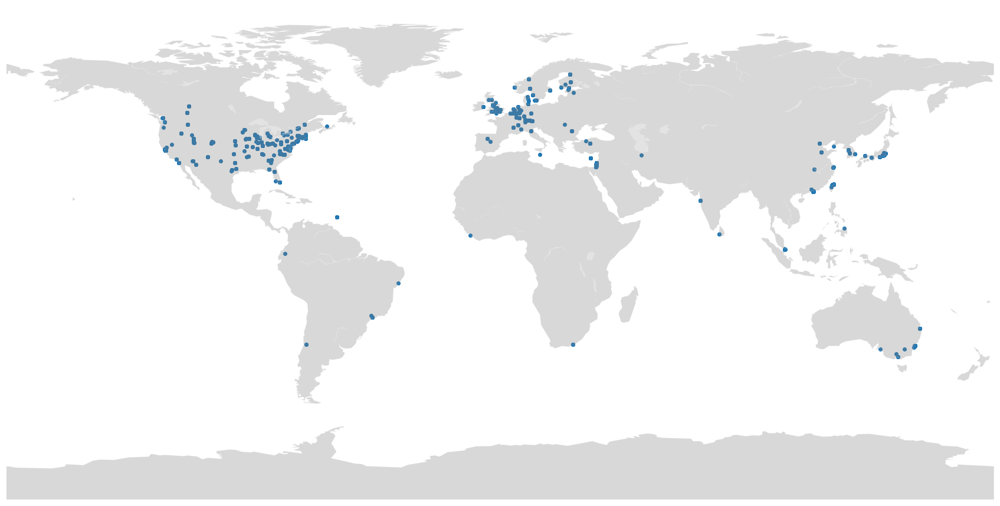

In [4]:
from mpl_toolkits.basemap import Basemap#run export PROJ_LIB=$CONDA_PREFIX/share/proj if this gives a key error

plt.figure(figsize=(30, 20))
m=Basemap()
m.drawmapboundary(linewidth=0)
m.fillcontinents(color='grey', alpha=0.3)
m.drawcoastlines(linewidth=0.1, color="white")
 
# prepare a color for each point depending on the continent.
data = universities.copy()
 
# Add a point per position
m.scatter(data['Lon'], data['Lat'])


## Base analysis of Universities present in dataset

#### What universities has the most contributors, and what percentage do they make up:

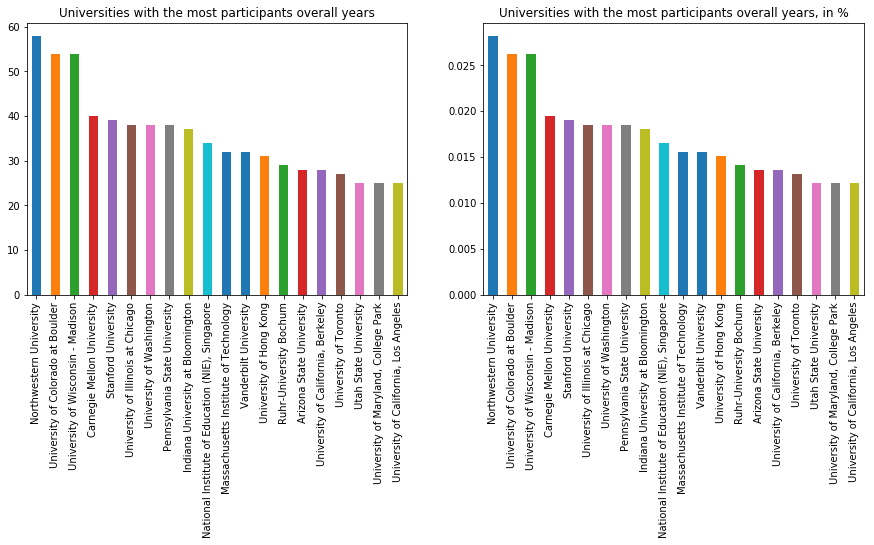

In [5]:
plt.figure(figsize=(15, 5))

plt.subplot(121)
plt.title('Universities with the most participants overall years')
universities[(~universities.mail.duplicated())].name.value_counts().head(20).plot(kind='bar')

plt.subplot(122)
plt.title('Universities with the most participants overall years, in %')
(universities[(~universities.mail.duplicated())].name.value_counts().head(20)/universities[(~universities.mail.duplicated())].shape[0]).plot(kind='bar')
plt.show()

#### What are the countries where the most contributors are?

As determined by university affiliation

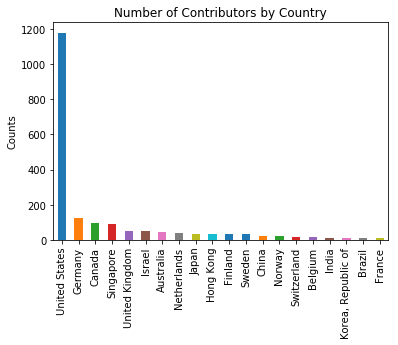

In [6]:
universities[(~universities.mail.duplicated())].country.value_counts().head(20).plot(kind = 'bar')
plt.title('Number of Contributors by Country') # as determinded by university affiliation
plt.ylabel('Counts')
plt.show()

## Considering ICLS and CSCL:

We look at which universities are present every year, only present during CSCL years and ICLS years:

In [7]:
universities['merge_index'] = universities.apply(lambda x: x['file']+str(x['author_order']), axis=1)

metadata = pd.read_csv('data/Parsed_metadata.csv', index_col=0, parse_dates=['accessioned', 'available', 'issued'])
metadata.issued = metadata.issued.map(lambda x: x.year)
metadata['merge_index'] = metadata.apply(lambda x: x['file']+str(x['author_order']), axis=1)
associations = pd.merge(universities, metadata, on='merge_index')

In [8]:
associations.rename(columns={'file_x': 'file'}, inplace=True)

In [9]:
#dataframe with paper - author - author affiliations
grouping =  associations.copy()
grouping = grouping[#only count a participant once (per year)
                    (~grouping[['issued', 'mail']].duplicated()) ]

#grouping =  pd.merge(metadata, universities, on='file')

In [10]:
#get universities by year
uni_year = grouping.groupby('issued').apply(lambda x: set(x['name']))

#get years in our dataset
years = uni_year.index.tolist()

#create a set of universities that have participated at some point
unis = uni_year.tolist()
all_ = set()
[all_.update(x) for x in unis]

#now use odd and even years to determine universities that participated every year in either ICLS or CSCL

all_years = unis[0]
ICLS = all_
CSCL = all_
for i, x in enumerate(unis):
    all_years = all_years.intersection(x)
    
    if years[i] % 2 == 0:
        ICLS = ICLS.intersection(x)
    else:
        CSCL = CSCL.intersection(x)

We now focus on universities that participated uniquely on one or the other conference:

In [11]:
ICLS, CSCL = ICLS.difference(CSCL), CSCL.difference(ICLS)

In [12]:
print('Number of universities represeted every year: ', len(all_years))
print('Number of universities represeted at every ICLS but not CSCL: ', len(ICLS))
print('Number of universities represeted at every CSCL but not ICLS: ', len(CSCL))

Number of universities represeted every year:  37
Number of universities represeted at every ICLS but not CSCL:  55
Number of universities represeted at every CSCL but not ICLS:  9


We now look into publication counts per university over the years:

In [13]:
grouping =  pd.merge(metadata, universities, on='file')
grouping = grouping[ #only count a participant once (per year)
                    (~grouping[['issued', 'mail']].duplicated()) & 
                    #only consider universities that participated every year
                    (grouping.name.isin(all_years))]

ranks = pd.DataFrame(grouping.groupby('issued').name.value_counts())
ranks.columns = ['count']
ranks.reset_index(inplace=True)
ranks.head()

,issued,name,count
0,2015,University of Toronto,12
1,2015,Göteborg University,9
2,2015,Universität Duisburg-Essen,9
3,2015,EPFL - EPF Lausanne,8
4,2015,Indiana University at Bloomington,8


There seems to be some patter indicating that even amongst universities that participate every year, there is a fluctiation of numbr of papers between ICLS and CSCL

In [14]:
#we only look at universities that have at least two submissions  each year
all_ = set()
ranks[ranks['count'] > 2].groupby('issued').apply(lambda x: all_.update(set(x['name'])))

for s in ranks[ranks['count'] > 2].groupby('issued').apply(lambda x: set(x['name'])).tolist():
    all_ = all_.intersection(s)

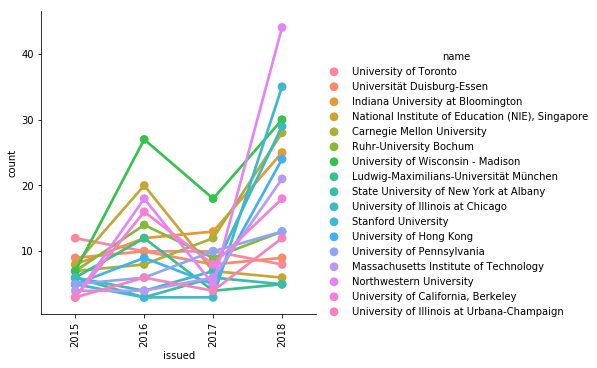

In [15]:
sns.catplot(data=ranks[ranks['name'].isin(all_) ], x='issued', y='count',kind='point', hue='name')
plt.xticks(rotation=90)
plt.show()

### Plotting the difference on a map:


We put a dot whos size depends on the number of contrinutions on the map. blue: ICLS; orange: CSCL

In [16]:
ranks = pd.merge(ranks, universities, on='name', 
                  how='left')[['issued', 'name', 'count', 'Lon', 'Lat']].drop_duplicates().reset_index(drop=True)

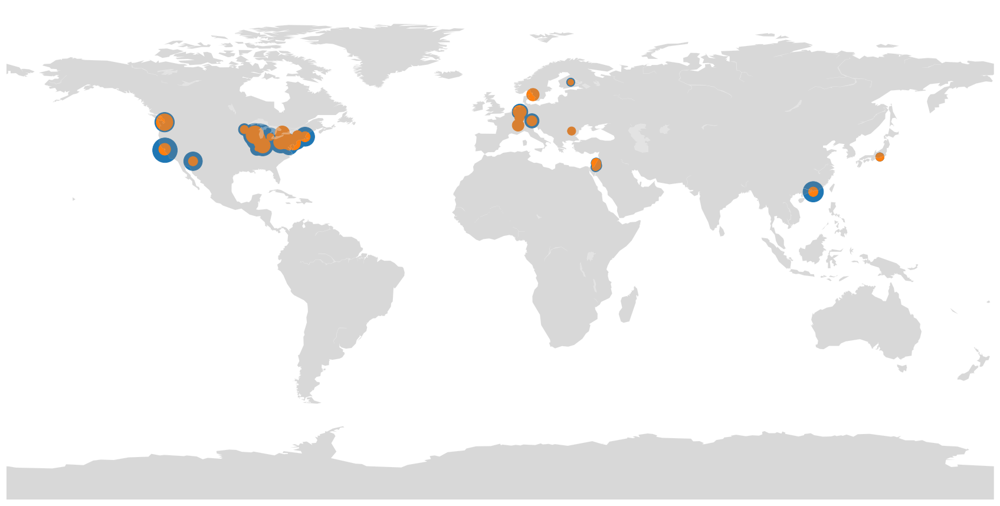

In [17]:
plt.figure(figsize=(30, 20))
m=Basemap()
m.drawmapboundary(linewidth=0)
m.fillcontinents(color='grey', alpha=0.3)
m.drawcoastlines(linewidth=0.1, color="white")
 
# prepare a color for each point depending on the continent.
data = ranks[ranks.issued%2 == 0].copy()
 
# Add a point per position
m.scatter(data['Lon'], data['Lat'], s=data['count']*50, cmap=plt.cm.Set2)

data = ranks[ranks.issued%2 == 1].copy()
 
# Add a point per position
m.scatter(data['Lon'], data['Lat'], s=data['count']*50, cmap=plt.cm.Set1)


### Do the same thing with countries

We have an interessting result:

Increase in number of participants is mostly due to new participants from the us.

In [18]:
uni_year = grouping.groupby('issued').apply(lambda x: set(x['country']))
years = uni_year.index.tolist()
unis = uni_year.tolist()
all_ = set()
[all_.update(x) for x in unis]

all_years = unis[0]
ICLS = all_
CSCL = all_


for i, x in enumerate(unis):
    all_years = all_years.intersection(x)

In [19]:
grouping =  associations.copy()
grouping = grouping[
                    #only count a participant once (per year)
                    (~grouping[['issued', 'mail']].duplicated()) & 
                    #only consider universities that participated every year
                    (grouping.country.isin(all_years))]


ranks = pd.DataFrame(grouping.groupby('issued').country.value_counts())
ranks.columns = ['count']
ranks.reset_index(inplace=True)

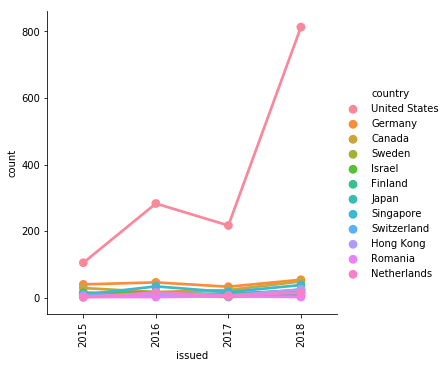

In [20]:
sns.catplot(data=ranks, x='issued', y='count',kind='point', hue='country')
plt.xticks(rotation=90)
plt.show()

Looking at it without america:

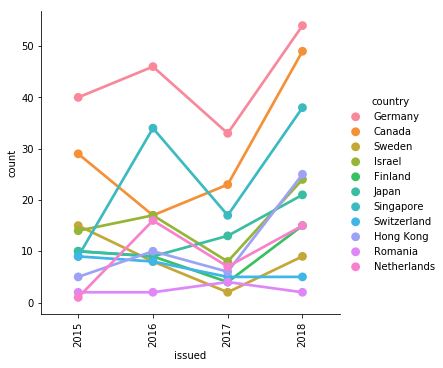

In [21]:
sns.catplot(data=ranks[(ranks.country != 'United States')], x='issued', y='count',kind='point', hue='country')
plt.xticks(rotation=90)
plt.show()

We now take an alternative view at countries, to see evolution in percentage:

In [22]:
grouping =  associations.copy()
grouping = grouping[(grouping.name != 'gmail') & 
                    #only count a participant once (per year)
                    (~grouping[['issued', 'mail']].duplicated())]

In [23]:
viz = pd.DataFrame(grouping[['country', 'name', 'file', 'issued']].groupby(['issued', 'country']).name.value_counts())
viz.columns = ['counts']
viz.reset_index(inplace=True)

Set a colorbar to get more readable plot:

In [24]:
country_bar = pd.DataFrame(viz.groupby(['country', 'issued']).counts.sum()/viz.groupby(['issued']).counts.sum()*100).copy()
country_bar.columns = ['counts']
country_bar.reset_index(inplace=True)
to_ignore = country_bar.loc[country_bar.counts < 1].country.unique()
country_bar.loc[country_bar.country.isin(to_ignore), 'country'] = 'Other'
country_bar = country_bar.groupby(['country', 'issued']).sum()
country_bar.columns = ['counts']
country_bar.reset_index(inplace=True)

country_bar.head()

,country,issued,counts
0,Australia,2015,3.819444
1,Australia,2016,2.761341
2,Australia,2017,1.630435
3,Australia,2018,1.787234
4,Canada,2015,10.069444


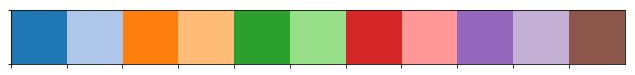

In [25]:
categories = country_bar.country.unique()
palette = sns.color_palette(palette='tab20', n_colors=len(categories)+1)

sns.palplot(palette)

We see that america makes up a bigger and bigger percentage

Text(0.5, 1.0, 'Participants by country (%)')

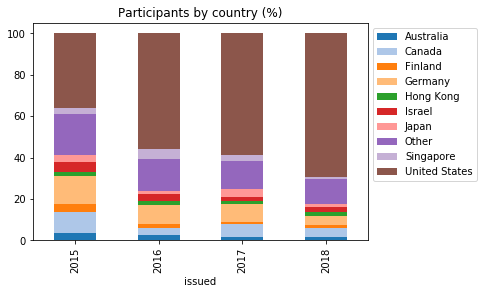

In [26]:
from matplotlib.colors import ListedColormap

country_bar = country_bar.pivot(index='issued', columns='country')
country_bar.columns = country_bar.columns.droplevel()

country_bar.plot(kind='bar', stacked=True, colormap=ListedColormap(palette))
plt.legend(bbox_to_anchor=(1, 1))
plt.title('Participants by country (%)')

In terms of absolute attendance, countries with less than 4 participants in any year are grouped into other to improve visibility:

Text(0.5, 1.0, 'Participants by country by conference')

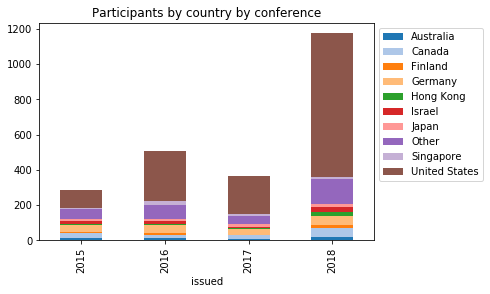

In [27]:
country_bar = pd.DataFrame(viz.groupby(['country', 'issued']).counts.sum()).copy()
country_bar.columns = ['counts']
country_bar.reset_index(inplace=True)
country_bar.loc[country_bar.country.isin(to_ignore), 'country'] = 'Other'
country_bar = country_bar.groupby(['country', 'issued']).sum()
country_bar.columns = ['counts']
country_bar.reset_index(inplace=True)

categories = country_bar.country.unique()
palette = sns.color_palette(palette='tab20', n_colors=len(categories)+1)

country_bar = country_bar.pivot(index='issued', columns='country')
country_bar.columns = country_bar.columns.droplevel()
country_bar.plot(kind='bar', stacked=True, colormap=ListedColormap(palette))
plt.legend(bbox_to_anchor=(1, 1))
plt.title('Participants by country by conference')

From before we know that some universities have very large increase, therefore we look at the increase in america more closely. We see that there are a lot more of authors from various universities contributing, which weren't contributing before.

Text(0.5, 1.0, 'Participants by US-university by conference')

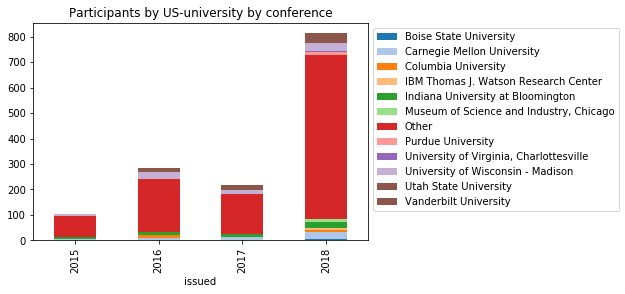

In [28]:
uni_bar = viz[viz.country == 'United States']
uni_bar = pd.DataFrame(uni_bar.groupby(['name', 'issued']).counts.sum()).copy()
uni_bar.columns = ['counts']
uni_bar.reset_index(inplace=True)

to_ignore = uni_bar.loc[uni_bar.counts < 6].name.unique()

uni_bar.loc[uni_bar.name.isin(to_ignore), 'name'] = 'Other'
uni_bar = uni_bar.groupby(['name', 'issued']).sum()
uni_bar.columns = ['counts']
uni_bar.reset_index(inplace=True)

uni_bar = uni_bar.pivot(index='issued', columns='name')
uni_bar.columns = uni_bar.columns.droplevel()
uni_bar.plot(kind='bar', stacked=True, colormap=ListedColormap(palette))

plt.legend(bbox_to_anchor=(1, 1))
plt.title('Participants by US-university by conference')

Text(0.5, 1.0, 'Participants by country by conference')

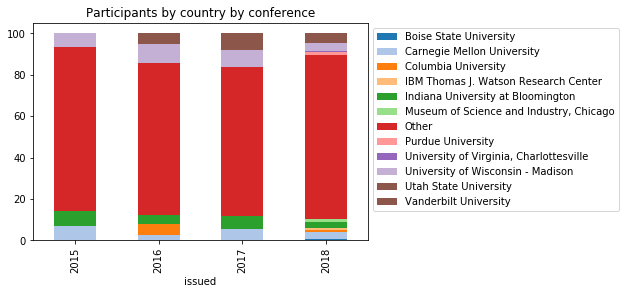

In [29]:
uni_bar = viz[viz.country == 'United States']
uni_bar = pd.DataFrame(uni_bar.groupby(['name', 'issued']).counts.sum()/uni_bar.groupby(['issued']).counts.sum()*100).copy()
uni_bar.columns = ['counts']
uni_bar.reset_index(inplace=True)
uni_bar.loc[uni_bar.name.isin(to_ignore), 'name'] = 'Other'
uni_bar = uni_bar.groupby(['name', 'issued']).sum()
uni_bar.columns = ['counts']
uni_bar.reset_index(inplace=True)

uni_bar = uni_bar.pivot(index='issued', columns='name')
uni_bar.columns = uni_bar.columns.droplevel()
uni_bar.plot(kind='bar', stacked=True, colormap=ListedColormap(palette))

plt.legend(bbox_to_anchor=(1, 1))
plt.title('Participants by country by conference')

In [30]:
uni_bar

name,Boise State University,Carnegie Mellon University,Columbia University,IBM Thomas J. Watson Research Center,Indiana University at Bloomington,"Museum of Science and Industry, Chicago",Other,Purdue University,"University of Virginia, Charlottesville",University of Wisconsin - Madison,Utah State University,Vanderbilt University
issued,,,,,,,,,,,,
2015,NaN,6.730769,NaN,NaN,7.692308,NaN,78.846154,NaN,NaN,6.730769,NaN,NaN
2016,NaN,2.826855,5.300353,NaN,4.240283,NaN,73.144876,NaN,NaN,9.540636,2.826855,2.120141
2017,NaN,5.555556,NaN,NaN,6.018519,NaN,72.222222,NaN,NaN,8.333333,4.629630,3.240741
2018,0.738007,3.444034,0.984010,0.861009,3.075031,1.107011,79.335793,1.230012,0.738007,3.690037,1.968020,2.829028


# Looking at where people collaborate:

## Building a collaboration graph, only taking into consideration countries:

We use the author index to match up author names with indices:

In [31]:
pub_collab = associations[['file','country', 'name']].drop_duplicates()
collabs = pd.merge(pub_collab, pub_collab, on='file').drop_duplicates()
collabs.dropna(inplace=True)
#collabs = collabs[collabs.country_x != collabs.country_y]
collabs.head()

,file,country_x,name_x,country_y,name_y
0,import2018_371,United States,University of Colorado at Boulder,United States,University of Colorado at Boulder
1,import2018_417,United States,Indiana University at Bloomington,United States,Indiana University at Bloomington
2,import2018_417,United States,Indiana University at Bloomington,United States,Indiana University
3,import2018_417,United States,Indiana University,United States,Indiana University at Bloomington
4,import2018_417,United States,Indiana University,United States,Indiana University


Building collaboration graph:

In [32]:
nodes = pd.DataFrame(collabs.country_x.dropna().unique())
nodes.columns = ['country']
nodes.reset_index(inplace=True)
nodes.head()

,index,country
0,0,United States
1,1,Germany
2,2,United Kingdom
3,3,Singapore
4,4,Canada


In [33]:
country_index = nodes.country.to_dict()
country_index = {v: k for k, v in country_index.items()}

collabs['index_x'] = collabs.country_x.map(country_index)
collabs['index_y'] = collabs.country_y.map(country_index)

edges = collabs[['index_x', 'index_y']].copy()

In [34]:
def get_adjacency(nodes, edges):
    n_nodes = len(nodes)
    adjacency = np.zeros((n_nodes, n_nodes), dtype=int)

    for idx, row in edges.iterrows():
        i, j = int(row.index_x), int(row.index_y)
        adjacency[i, j] += 1
        adjacency[j, i] = adjacency[i, j]


    return adjacency

In [35]:
adjacency = get_adjacency(nodes, edges)

In [36]:
n_nodes = len(nodes)
graph = nx.from_numpy_array(adjacency - np.identity(n_nodes)*adjacency)
mapping = nodes.country.to_dict()

Visualizing the adjacency matrix:

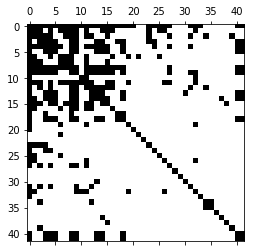

In [37]:
plt.spy(adjacency)

## Most collaborative countries

The number represented is: number of different papers written in collaboration with an other country.
Clearly, as the owerall number of papers for the us is extremly hight, the US will dominate this graph:

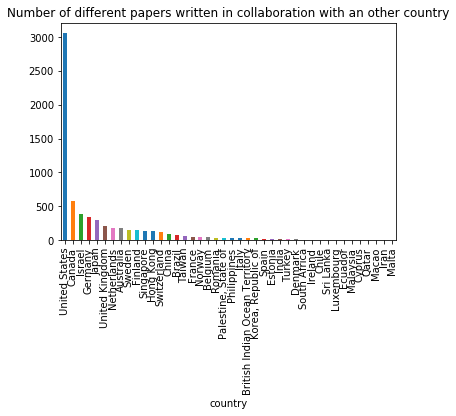

In [38]:
nodes['degrees'] = pd.Series(adjacency.sum(axis=1))
plt.title('Number of different papers written in collaboration with an other country')
nodes.set_index('country').degrees.sort_values(ascending=False).plot(kind='bar')

What country has most collaborations with different countries?
That the number on the y axis is the number of countries the country on the x axis collaborates with: 

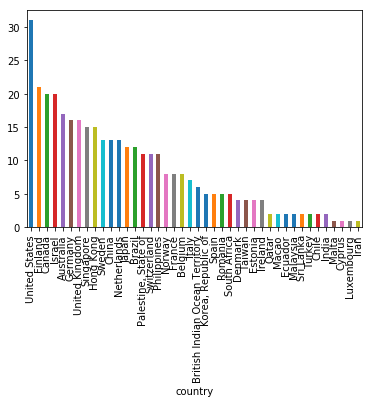

In [39]:
nodes['degrees'] = pd.Series(np.where(adjacency > 0, 1, 0).sum(axis=1))
nodes.set_index('country').degrees.sort_values(ascending=False).plot(kind='bar')

## Isolated Countries

In [40]:
zero_collabs = np.where((adjacency - adjacency*np.identity(n_nodes)).sum(axis=1) == 0)
nodes.iloc[zero_collabs]

,index,country,degrees
22,22,Iran,1
28,28,Luxembourg,1
29,29,Malta,1
36,36,Cyprus,1


## Looking at the countries that do collaborate:

The total number of connected components (including isolated nodes) is:

In [41]:
nx.number_connected_components(graph)

5

Hence all other countries are part of the main component.

To more easely visualize the graph we extract the largest component and try to partition/cluster the graph in some way. Here we use the kernighan lin bisection algorithm to find a bisection. The bisection groupy the countries into countries with a lot of collaboration and little collaboration.

In [42]:
components = nx.connected_components(graph)
largest_cc = max(nx.connected_components(graph), key=len)
graph = graph.subgraph(largest_cc)

In [43]:
#remove countries not in largest component
mapping = {k:mapping[k] for k in largest_cc if k in mapping}

In [44]:
from networkx.algorithms.community import kernighan_lin_bisection
c = list(kernighan_lin_bisection(graph))

In [45]:
def matching_by_criteria(c):
    member_label = {}
    for index, community in enumerate(c):
        members = list(community)
        for m in members:
            member_label[m] = index
    return member_label

country_partition = matching_by_criteria(c)

Change size of nodes based on with how many other countries a country interacts:

We use degree centrality, which will be large for countries with a lot of collaboration and small for countries with little collaboration.

In [46]:
node_size = (np.array(list(nx.degree_centrality(graph).values())))*1000

/anaconda3/envs/Biblio/lib/python3.7/site-packages/networkx/drawing/nx_pylab.py:611: MatplotlibDeprecationWarning: isinstance(..., numbers.Number)
  if cb.is_numlike(alpha):


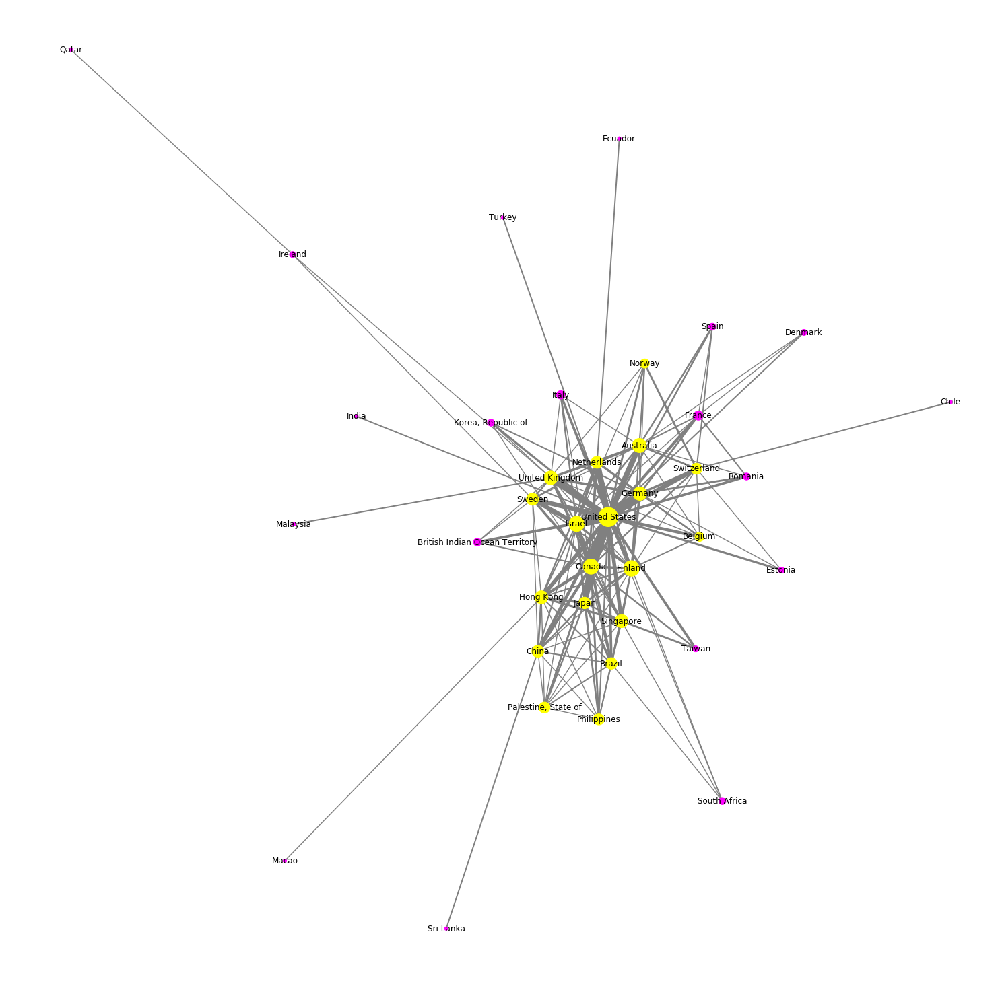

In [47]:
plt.figure(figsize=(20, 20))
nx.draw_spring(graph,  edge_color='grey', 
               node_color=pd.Series(country_partition).sort_index().tolist(), 
               width = np.sqrt(np.array(list(nx.get_edge_attributes(graph, 'weight').values()))),
               #edge_color = list(nx.get_edge_attributes(graph, 'weight').values()),
               #edge_cmap = plt.cm.gray_r,
               cmap='spring', 
               node_size=node_size, 
               labels=mapping)

In [48]:
edges_drawing = np.array(list(nx.get_edge_attributes(graph, 'weight').values()))

/anaconda3/envs/Biblio/lib/python3.7/site-packages/networkx/drawing/nx_pylab.py:611: MatplotlibDeprecationWarning: isinstance(..., numbers.Number)
  if cb.is_numlike(alpha):


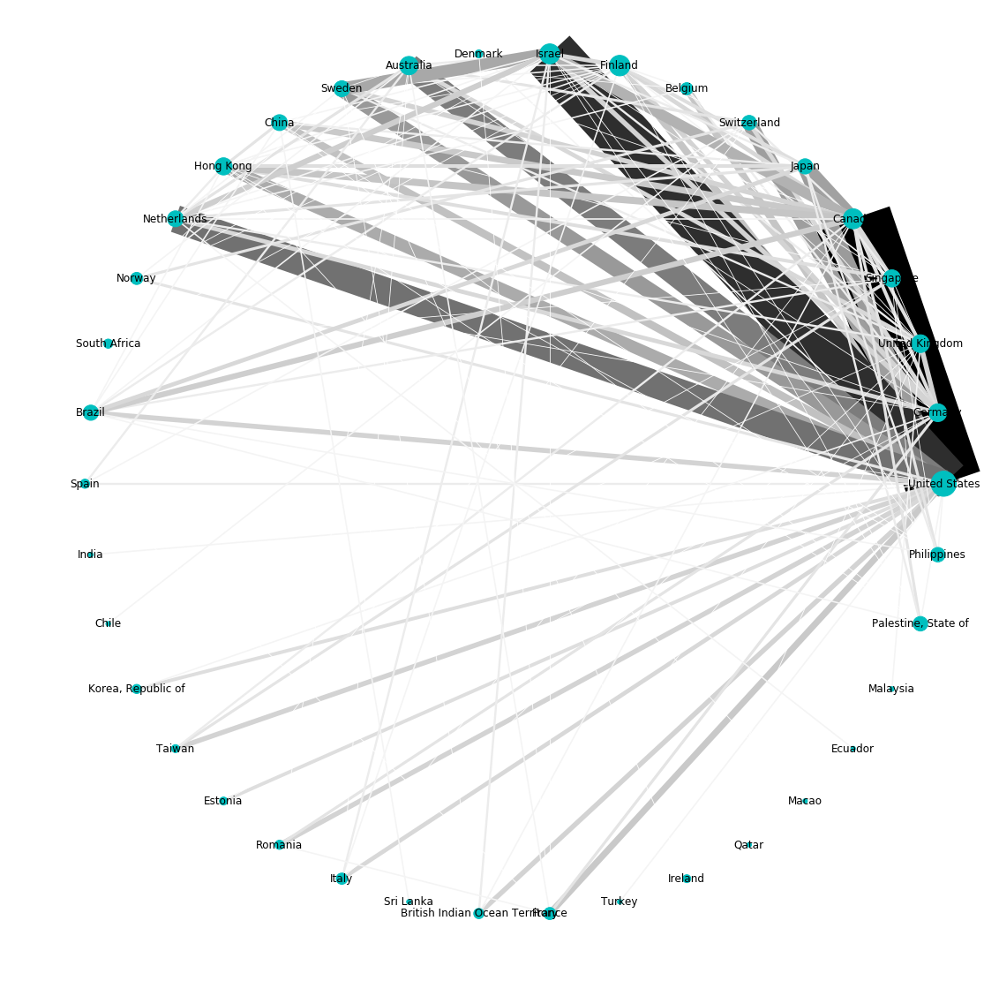

In [49]:
plt.figure(figsize=(15, 15))
nx.draw_circular(graph, 
               node_color='c', 
               width = edges_drawing/2.5,
               edge_color = np.sqrt(edges_drawing)/2,
               edge_cmap = plt.cm.gray_r,
               node_size=node_size, 
               labels=mapping)

# Do the same for university as we did for country:

Find who collaborated with whom on a paper and turn the resulting edge list into a graph:

In [50]:
pub_collab = associations[['file','name', 'country']].drop_duplicates()
pub_collab = pub_collab[pub_collab.name != 'gmail']
collabs = pd.merge(pub_collab, pub_collab, on='file').drop_duplicates()

#collabs = collabs[collabs.name_x != collabs.name_y]

nodes = pd.DataFrame(collabs.name_x.dropna().unique())
nodes.columns = ['name']
nodes.reset_index(inplace=True)

In [51]:
uni_index = nodes.name.to_dict()
uni_index = {v: k for k, v in uni_index.items()}

collabs['index_x'] = collabs.name_x.map(uni_index)
collabs['index_y'] = collabs.name_y.map(uni_index)

edges = collabs[['index_x', 'index_y']].dropna()

In [52]:
adjacency = get_adjacency(nodes, edges)
n_nodes = len(nodes)
graph = nx.from_numpy_array(adjacency - np.identity(n_nodes)*adjacency)
mapping = nodes.name.to_dict()

H=nx.relabel_nodes(graph,mapping)

### Most collaborative universities:

number of different papers written in collaboration with an other university.

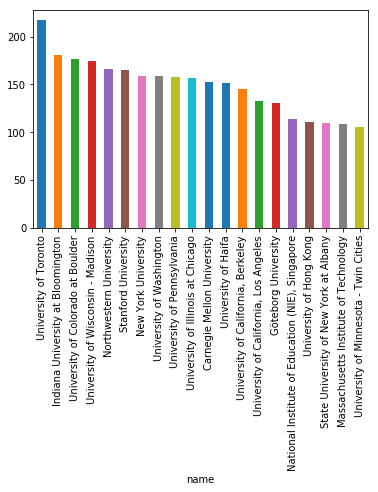

In [53]:
nodes['degrees'] = pd.Series(adjacency.sum(axis=1))
nodes.set_index('name').degrees.sort_values(ascending=False).head(20).plot(kind='bar')

Number of distinct different institution collbaorations:
The number on the y axis is the number of different institutions a university collaborated with (without counting how often the did this.)

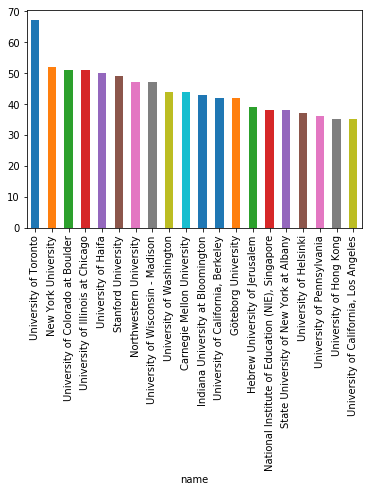

In [54]:
nodes['degrees'] = pd.Series(np.where(adjacency > 0, 1, 0).sum(axis=1))
nodes.set_index('name').degrees.sort_values(ascending=False).head(20).plot(kind='bar')

## Isolated universities:

Analyzing Universities that have not collaborated with other universities:

In [55]:
zero_collabs = np.where((adjacency - adjacency*np.identity(n_nodes)).sum(axis=1) == 0)
zero_collabs[0].shape

(42,)

In [56]:
nodes.iloc[zero_collabs][nodes.name.map(lambda x: True  if reg.search('\p{Lu}', x) else False)]

/anaconda3/envs/Biblio/lib/python3.7/site-packages/ipykernel_launcher.py:1: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  """Entry point for launching an IPython kernel.


,index,name,degrees
40,40,Aarhus University,1
69,69,Brandeis University,1
77,77,University of Massachusetts at Amherst,1
101,101,"Aalborg University, Denmark",1
110,110,University of Missouri - Columbia,1
111,111,Oklahoma State University,1
116,116,Harding University,1
124,124,Tarbiat Modares University,1
125,125,Stockholm University,1
135,135,Hanyang University,1


## Analyzing main group of universities interacting:

We only look at largest component and ignore universities that don't belong to the main cluster

In [57]:
components = nx.connected_components(graph)
largest_cc = max(components, key=len)

main_universities = graph.subgraph(largest_cc)

Number of components of universities that collaborate outside of main cluster:

In [58]:
nx.number_connected_components(graph) - zero_collabs[0].shape[0]-1

10

We look at the smaller connected components with at least 3 nodes:

/anaconda3/envs/Biblio/lib/python3.7/site-packages/networkx/drawing/nx_pylab.py:611: MatplotlibDeprecationWarning: isinstance(..., numbers.Number)
  if cb.is_numlike(alpha):


188            Shandong University
189     Liaoning Normal University
190    National Science Foundation
Name: name, dtype: object


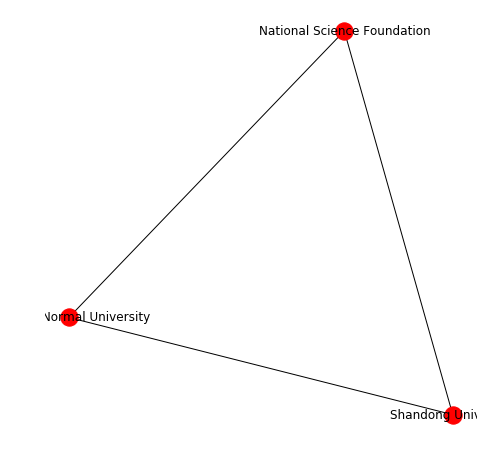

258    Illinois State University
259       Wake Forest University
260    Missouri State University
Name: name, dtype: object


/anaconda3/envs/Biblio/lib/python3.7/site-packages/networkx/drawing/nx_pylab.py:611: MatplotlibDeprecationWarning: isinstance(..., numbers.Number)
  if cb.is_numlike(alpha):


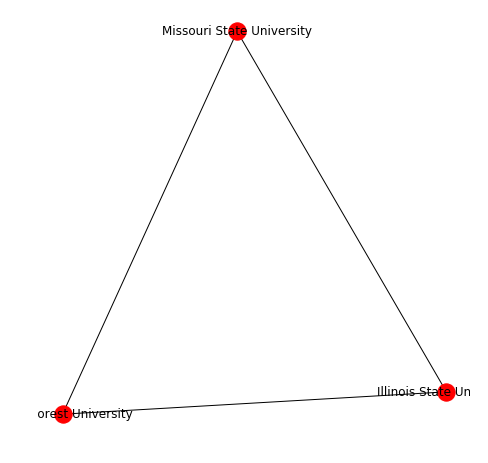

In [59]:
for g in list(nx.connected_component_subgraphs(graph)):
   
    if len(g.nodes) > 2 and len(g.nodes) < len(largest_cc):
        plt.figure(figsize=(6, 6))
        nx.draw_spring(g, labels=nodes.iloc[list(g.nodes)].name.to_dict())
        print(nodes.iloc[list(g.nodes)].name)
        plt.show()

### Main component

We partition the nodes to find "communities" of universities. They are the colored with the same color

In [60]:
from networkx.algorithms.community import greedy_modularity_communities
partition = list(greedy_modularity_communities(main_universities))
uni_partition = matching_by_criteria(partition)

Our partitioning algorthims finds 14 communities:

In [61]:
len(partition)

15

Change size of nodes based on with how many other countries a country interacts: the more connections the other nodes it has the larger the node will be.


For readability only nodes with some of the largest values –universities who are at the center of collaboration– are labeled. 

In [62]:
node_size = np.array(list(nx.degree_centrality(main_universities).values()))
edge_width = np.array(list(nx.get_edge_attributes(main_universities, 'weight').values()))

In [63]:
np.sqrt(edge_width).max()

4.69041575982343

In [64]:
nodes.loc[list(largest_cc),'node_size'] = node_size

In [65]:
labels = nodes.iloc[list(largest_cc)][nodes.node_size > np.percentile(node_size, 97.5)].name

/anaconda3/envs/Biblio/lib/python3.7/site-packages/ipykernel_launcher.py:1: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  """Entry point for launching an IPython kernel.


The color pallete for each cluster corresponds to the following cluster number:

   1  ||  2  ||  3  ||  4  ||  5  ||  6  ||  7  ||  8  ||  9  ||  10  ||  11  ||  12  ||  13  ||  14  ||  15


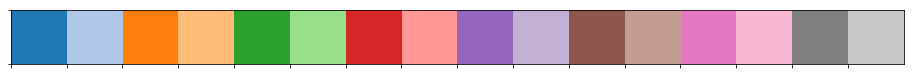

In [66]:
palette = sns.color_palette(palette='tab20', n_colors=len(partition)+1)

sns.palplot(palette)
print('  ', '  ||  '.join([str(i) for i in list(range(1,len(partition)+1))]))

/anaconda3/envs/Biblio/lib/python3.7/site-packages/networkx/drawing/nx_pylab.py:611: MatplotlibDeprecationWarning: isinstance(..., numbers.Number)
  if cb.is_numlike(alpha):


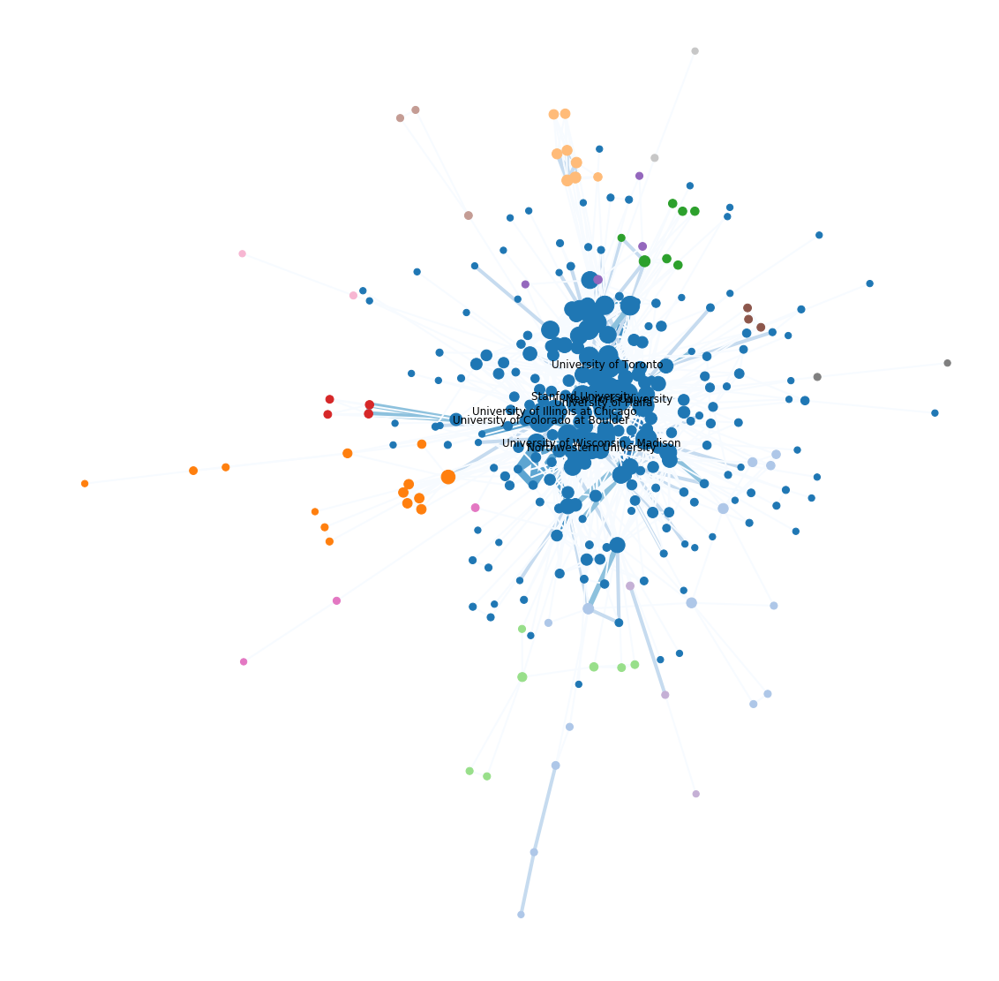

In [67]:
plt.figure(figsize=(15, 15))
nx.draw_spring(main_universities,  #edge_color='grey', 
               node_color=pd.Series(uni_partition).sort_index().tolist(),
               width = edge_width,
               edge_color = np.log(edge_width+1),
               edge_cmap = plt.cm.Blues,
               cmap=ListedColormap(palette.as_hex()), 
               node_size=(node_size+0.01)*4000, 
               labels=labels.to_dict(),
               iterations=5000
              )

The most collaboration friendly unis according to degree centrality are:

In [68]:
labels

0     University of Colorado at Boulder
18    University of Illinois at Chicago
19                University of Toronto
26                  New York University
32    University of Wisconsin - Madison
61                  University of Haifa
86                  Stanford University
87              Northwestern University
Name: name, dtype: object

In [69]:
nodes[['Lon', 'Lat']] = pd.merge(nodes, universities, on='name', 
                  how='left')[[ 'name',  'Lon', 'Lat']].drop_duplicates().reset_index(drop=True)[['Lon', 'Lat']]

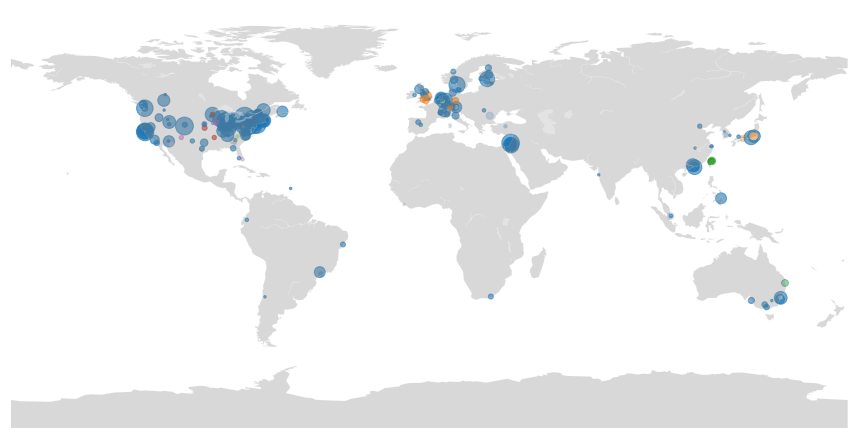

In [70]:
plt.figure(figsize=(15, 20))
m=Basemap()
m.drawmapboundary(linewidth=0)
m.fillcontinents(color='grey', alpha=0.3)
m.drawcoastlines(linewidth=0.1, color="white")
 
# prepare a color for each point depending on the continent.
data = nodes.iloc[list(largest_cc)].copy()
 
# Add a point per position
m.scatter(data['Lon'], data['Lat'], s=node_size*2000, c=pd.Series(uni_partition).sort_index().tolist(), 
          cmap=ListedColormap(palette.as_hex()), alpha=0.6)


The Universities in each cluster are:

Cluster number:  1


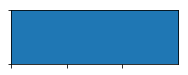

['University of Colorado at Boulder', 'Indiana University at Bloomington', 'Indiana University', 'Technische Universität München', 'Universität Augsburg', 'Ludwig-Maximilians-Universität München', 'University of Edinburgh', 'San Jose State University', 'Harvard University', 'Vanderbilt University', 'University College London, University of London', 'University of Illinois at Chicago', 'University of Toronto', 'Tokyo University', 'Pennsylvania State University', 'New York University', 'Simon Fraser University', 'EPFL - EPF Lausanne', 'Ghent University', 'University of Jyväskylä', 'Swiss Federal Institute for Vocational Education and Training', 'University of Wisconsin - Madison', 'Arizona State University', 'Hebrew University of Jerusalem', 'University of Texas at Austin', 'University of Maryland, College Park', 'University of California, Berkeley', 'Utah State University', 'University of Washington', 'DePaul University', 'Shizuoka University', 'State University of New York at Albany', 

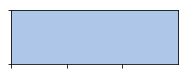

['Georgia State University', 'Virginia Commonwealth University', 'Texas State University', 'Ankara University', 'Middle East Technical University', 'Korea Advanced Institute of Science & Technology', 'Worcester Polytechnic Institute', 'Drexel University', 'University of Warwick', 'Macquarie University', 'Mercer University', 'National University of Singapore', 'University Politehnica of Bucharest', 'Universität der Bundeswehr München, Germany']
Cluster number:  3


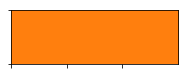

['Knowledge Media Research Center', 'Universität Konstanz', 'Bauhaus Universität Weimar', 'University of Southampton', 'University of the West of England, Bristol', 'McGraw-Hill Education', 'School of Education, University of Nottingham', 'University of Nottingham', 'Google Inc.', 'University of Nottingham, Malaysia Campus', 'Department of Psychology, Durham University', 'Eberhard-Karls-Universität Tübingen', 'Practice for Giftedness and High Achievement Potential', 'Leibniz-Institut für Wissensmedien']
Cluster number:  4


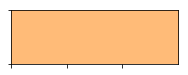

['Soka University', 'Yokohama National University', 'The Open University of Japan', 'Senshu University', 'Kobe University', 'Utsunomiya University', 'Ibaraki University', 'Tokyo Gakugei University']
Cluster number:  5


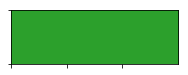

['National Taiwan University of Science and Technology', 'National Taichung University of Science and Technology, Taiwan', 'National Chengchi University', 'National Hsinchu University of Education', 'National Central University', 'National Taiwan Normal University', 'National Tsinghua University']
Cluster number:  6


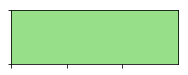

['Griffith University', 'Open University', 'Maastricht University', 'University of Technology Sydney', 'Warren Wilson College', 'Queensland University of Technology', 'James Cook University of North Queensland']
Cluster number:  7


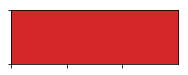

['Universität Köln', 'Kansas State University', 'University of Central Arkansas', 'Rochester Institute of Technology']
Cluster number:  8


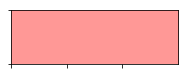

['Central College', 'University of Iowa', 'University of California, Irvine', 'University of Chicago']
Cluster number:  9


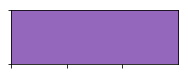

['University of Arizona', 'University of Miami', 'University of Maine System']
Cluster number:  10


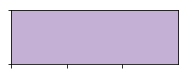

['Minneapolis Institute of Art', 'Science Museum of Minnesota', 'State University of New York at Binghamton']
Cluster number:  11


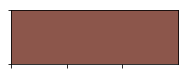

['Educational Testing Service', 'Sony Interactive Entertainment', 'Universidade de São Paulo']
Cluster number:  12


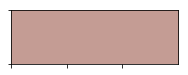

['Ohio State University, Columbus', 'University of Southern Denmark - SDU', 'University of New Mexico']
Cluster number:  13


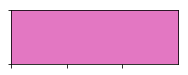

['Temple University', 'University of Delaware']
Cluster number:  14


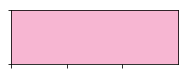

['University of Georgia', 'West Virginia University']
Cluster number:  15


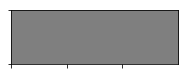

['Ministry of Education', 'Nanyang Technological University']


In [71]:
for i, m in enumerate(list(greedy_modularity_communities(main_universities))):
    unis = nodes.iloc[list(m)]
    unis = unis[unis.name.map(lambda x: True if reg.search('\p{Lu}',x) else False)].name.unique().tolist() 
    if len(unis) > 1:
        print('Cluster number: ', i+1)
        sns.palplot(palette[i])
        plt.show()
        print(unis)

# Looking at co authorship, taking into consideration country and inst.

We use the associations frame again to build a co-authorship graph based on people with attributes country and institution

In [72]:
associations.columns

Index(['file', 'name', 'domain', 'mail', 'author_order_x', 'country', 'Lat',
       'Lon', 'merge_index', 'file_y', 'subject', 'iso', 'uri', 'type',
       'publisher', 'title', 'issued', 'accessioned', 'citation', 'available',
       'abstract', 'long_name', 'author_order_y', 'shortend_names',
       'identifier'],
      dtype='object')

In [73]:
#we can drop one of the file columns
(associations.file != associations.file_y).sum()

0

In [74]:
del associations['file_y']

In [75]:
associations = associations[associations.country.notna()]

In [76]:
self_merge = pd.merge(associations, associations, on='file')
self_merge = self_merge[self_merge.long_name_x != self_merge.long_name_y]

edges = self_merge[['long_name_x', 'long_name_y', 'issued_x']].copy()

nodes = associations[~associations.long_name.duplicated()].reset_index(drop=True).reset_index()

name_index = nodes.long_name.to_dict()
name_index = {v: k for k, v in name_index.items()}

In [77]:
edges['index_x'] = edges.long_name_x.map(name_index)
edges['index_y'] = edges.long_name_y.map(name_index)

adjacency = get_adjacency(nodes, edges)
graph = nx.from_numpy_array(adjacency)

Adding attributes to the graph:

In [78]:
edge_dict = {}
for i, row in edges.iterrows():
    edge_dict[(row['index_x'], row['index_y'])] =  row['issued_x']

In [79]:
nx.set_edge_attributes(graph, edge_dict, name='year')
nx.set_node_attributes(graph, nodes.country.to_dict(), name='country')
nx.set_node_attributes(graph, nodes.name.to_dict(), name='uni')
mapping = nodes.long_name.to_dict()
H=nx.relabel_nodes(graph,mapping)

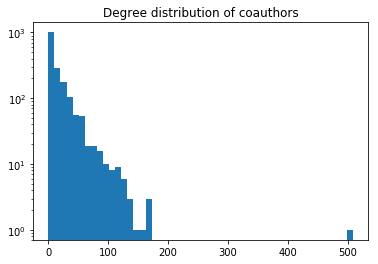

In [80]:
plt.title('Degree distribution of coauthors')
plt.hist(adjacency.sum(axis=1), bins=50, log=True)
plt.show()

This is a simple drawing of our network: we see that there is a large core communit, and many many smaller comminitues of co authors. We will look more into the main community

/anaconda3/envs/Biblio/lib/python3.7/site-packages/networkx/drawing/nx_pylab.py:611: MatplotlibDeprecationWarning: isinstance(..., numbers.Number)
  if cb.is_numlike(alpha):


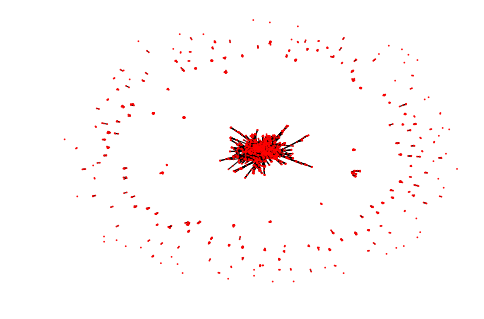

In [81]:
nx.draw(graph, pos=nx.spring_layout(graph), node_size=[0.5,0.5])

In [82]:
embedding = nodes.apply(lambda x: [x.Lon, x.Lat], axis=1)

/anaconda3/envs/Biblio/lib/python3.7/site-packages/networkx/drawing/nx_pylab.py:611: MatplotlibDeprecationWarning: isinstance(..., numbers.Number)
  if cb.is_numlike(alpha):


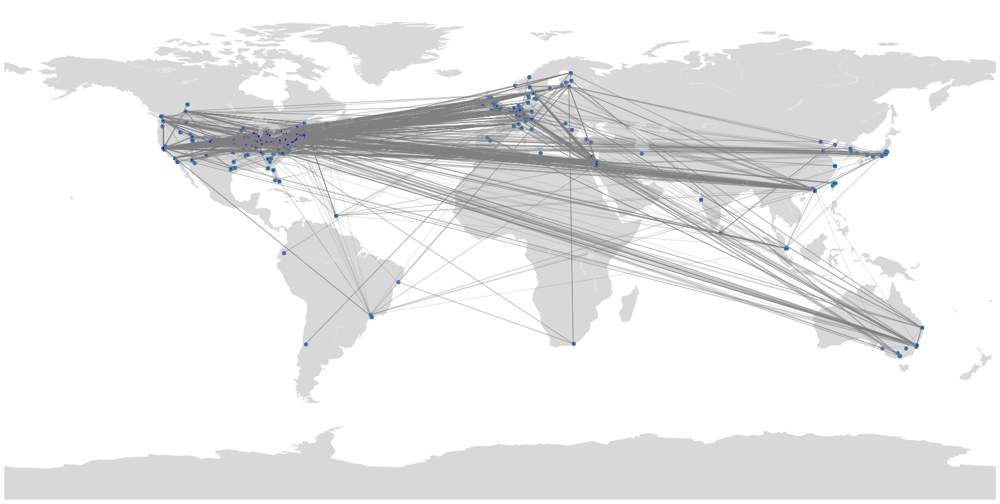

In [83]:

plt.figure(figsize=(30, 20))
m=Basemap()
m.drawmapboundary(linewidth=0)
m.fillcontinents(color='grey', alpha=0.3)
m.drawcoastlines(linewidth=0.1, color="white")
 
# prepare a color for each point depending on the continent.
data = nodes.copy()
 
# Add a point per position
m.scatter(data['Lon'], data['Lat'])
nx.draw(graph, node_size=[0.5,0.5], pos = embedding, edge_color='grey', node_color='b', alpha=0.3)


We focus in on the different components:

In [84]:
#get components
components = nx.connected_components(graph)
largest_cc = max(nx.connected_components(graph), key=len)

The total number of components is:

In [85]:
nx.number_connected_components(graph)

207

In [86]:
print(f'the largest component contains : {len(largest_cc)} people')

the largest component contains : 1148 people


/anaconda3/envs/Biblio/lib/python3.7/site-packages/networkx/drawing/nx_pylab.py:611: MatplotlibDeprecationWarning: isinstance(..., numbers.Number)
  if cb.is_numlike(alpha):


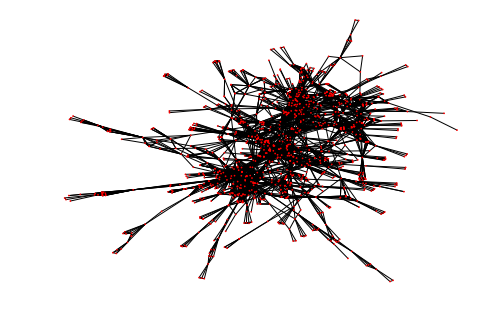

In [87]:
nx.draw(graph.subgraph(largest_cc), node_size=[0.5,0.5])

Drawing it in a geographical embedding:

In [88]:
embedding = nodes.iloc[list(largest_cc)].apply(lambda x: [x.Lon, x.Lat], axis=1)

/anaconda3/envs/Biblio/lib/python3.7/site-packages/networkx/drawing/nx_pylab.py:611: MatplotlibDeprecationWarning: isinstance(..., numbers.Number)
  if cb.is_numlike(alpha):


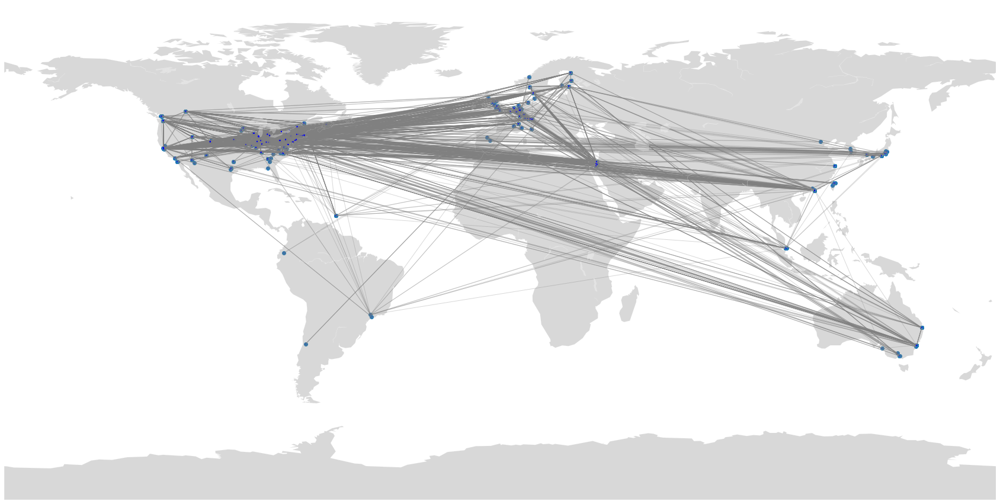

In [89]:
plt.figure(figsize=(30, 20))
m=Basemap()
m.drawmapboundary(linewidth=0)
m.fillcontinents(color='grey', alpha=0.3)
m.drawcoastlines(linewidth=0.1, color="white")
 
# prepare a color for each point depending on the continent.
data = nodes.iloc[list(largest_cc)].copy()
 
# Add a point per position
m.scatter(data['Lon'], data['Lat'])
nx.draw(graph.subgraph(largest_cc), node_size=[0.5,0.5], pos = embedding, edge_color='grey', node_color='b', alpha=0.3)


### Who colaborates the most:

We can easely find the people who worked with the most other people:
(counting repeat collaboration)

In [90]:
nodes['collabs_weighted'] = adjacency.sum(axis=1)
nodes.sort_values(by='collabs_weighted', ascending=False)[['long_name', 'country', 'name', 'collabs_weighted']].head(10)

,long_name,country,name,collabs_weighted
178,"Rummel, Nikol",Germany,Ruhr-University Bochum,508
38,"Slotta, James D.",Canada,University of Toronto,170
119,"Danish, Joshua A.",United States,Indiana University at Bloomington,166
96,"Zhang, Jianwei",United States,State University of New York at Albany,164
318,"kafai, yasmin",United States,University of Pennsylvania,158
1249,"Wichmann, Astrid",Germany,Ruhr-University Bochum,144
145,"Kali, Yael",Sweden,Göteborg University,138
555,"Enyedy, Noel",United States,"University of California, Los Angeles",136
97,"Chen, Mei-Hwa",United States,State University of New York at Albany,134
418,"Dillenbourg, Pierre",Switzerland,EPFL - EPF Lausanne,132


Same as above but counting person only once:

In [91]:
nodes['collabs_unweighted'] = np.where(adjacency > 0, 1, 0).sum(axis=1)
nodes.sort_values(by='collabs_unweighted', ascending=False)[['long_name', 'country', 'name', 'collabs_unweighted']].head(10)

,long_name,country,name,collabs_unweighted
145,"Kali, Yael",Sweden,Göteborg University,64
178,"Rummel, Nikol",Germany,Ruhr-University Bochum,61
38,"Slotta, James D.",Canada,University of Toronto,61
96,"Zhang, Jianwei",United States,State University of New York at Albany,57
39,"Acosta, Alisa",Canada,University of Toronto,55
317,"Rosé, Carolyn",United States,Carnegie Mellon University,53
609,"Bang, Megan",United States,University of Washington,53
97,"Chen, Mei-Hwa",United States,State University of New York at Albany,52
318,"kafai, yasmin",United States,University of Pennsylvania,50
80,"Bell, Philip",United States,University of Washington,47


### Zooming into largest community: - country & institution

In [92]:
main_component = nodes[nodes.index.isin(largest_cc)]

Comparing the country representation in main component to the one overall.

Text(0, 0.5, 'Counts')

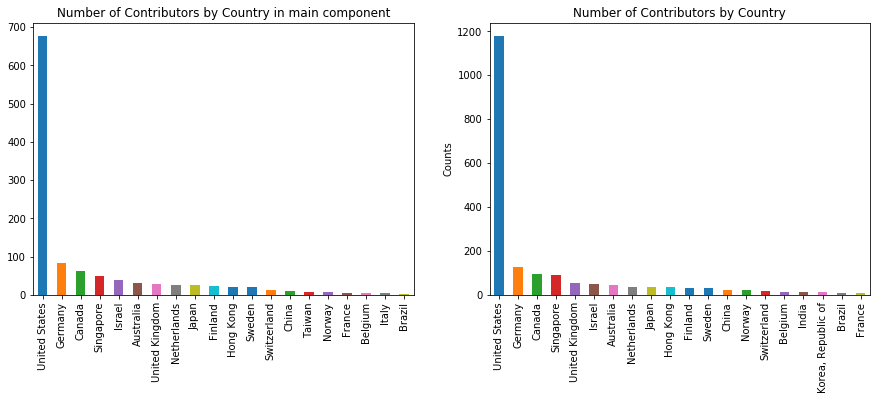

In [93]:
plt.figure(figsize=(15, 5))
plt.subplot(121)
plt.title('Number of Contributors by Country in main component')
main_component.country.value_counts().head(20).plot(kind='bar')
plt.subplot(122)
universities[(~universities.mail.duplicated())].country.value_counts().head(20).plot(kind = 'bar')
plt.title('Number of Contributors by Country') # as determinded by university affiliation
plt.ylabel('Counts')

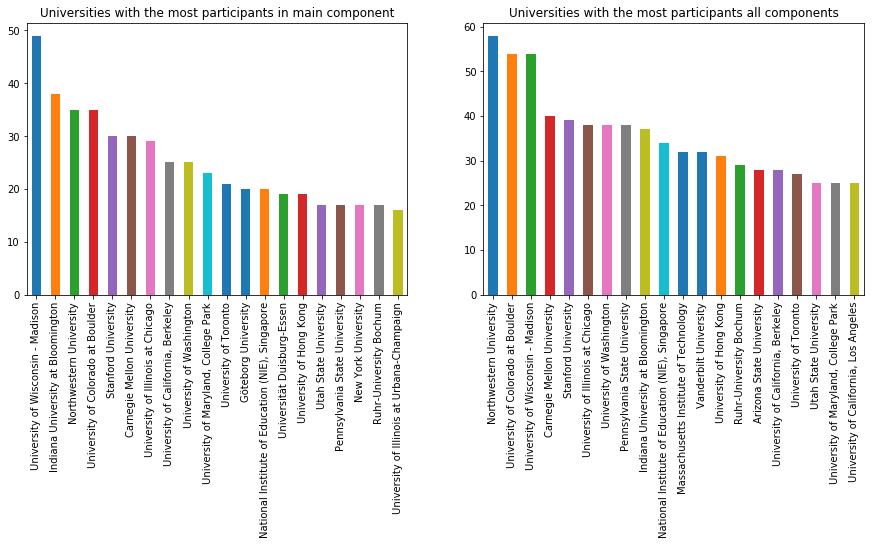

In [94]:
plt.figure(figsize=(15, 5))
plt.subplot(121)
#plt.ylim([0, 60])
plt.title('Universities with the most participants in main component')
main_component.name.value_counts().head(20).plot(kind='bar')
plt.subplot(122)
#plt.ylim([0, 60])
plt.title('Universities with the most participants all components')
universities[(universities.name != 'gmail') & (~universities.mail.duplicated())].name.value_counts().head(20).plot(kind='bar')
plt.show()

## Finding communities in the community: Modularity and Other measures

Constructing the graph with the largest component:

In [95]:
main_component = graph.subgraph(largest_cc)
mapping = nodes.long_name.to_dict()
main_component=nx.relabel_nodes(main_component,mapping)

Here we use modularity to detect communities, which will find subgraph that are unliquely to have developed "randomly".

From wikipedia:

>It was designed to measure the strength of division of a network into modules (also called groups, clusters or communities). Networks with high modularity have dense connections between the nodes within modules but sparse connections between nodes in different modules. Modularity is often used in optimization methods for detecting community structure in networks

In [96]:
c = list(greedy_modularity_communities(main_component))

We find 18 communities in total:

In [97]:
len(c)

20

In [98]:
#smallest community:
min(c, key=len)

frozenset({'Quignard, Matthieu', 'Tchounikine, Pierre', 'Wang, Patrick'})

## Intermezzo: removing duplicate names!

We could use this to elliminate duplicates, merge some people:

The difficulty is to not have any false positives. False negatives are fine, We thus decide to look at similar names **within** the communities we found. Additionaly we check that the same last name is present and exclude some last names (chinese ones) as they are prone to lead to false positives.

In [99]:
#example of duplicates showing up!
metadata[metadata.long_name.isin(['Cuendet, Sebastien', 'Cuendet, Sébastien'])]

,file,subject,iso,uri,type,publisher,title,issued,accessioned,citation,available,abstract,long_name,author_order,shortend_names,identifier,merge_index
1656,import2016full_68,NaN,en,info:doi/10.22318/icls2016.68,Book chapter,Singapore: International Society of the Learni...,Detecting Collaborative Dynamics Using Mobile ...,2016,2017-03-21 12:05:42,"Schneider, B., Sharma, K., Cuendet, S., Zuffer...",2017-03-21 12:05:42,Prior work has successfully described how low ...,"Cuendet, Sebastien",2,Sharma K.,"Schneider, B., Sharma, K., Cuendet, S., Zuffer...",import2016full_682
1742,import2015full_182,"['tangible user interface', 'eye-tracking', 'j...",en,https://doi.dx.org/10.22318/cscl2015.182,Book chapter,International Society of the Learning Science...,3D Tangibles Facilitate Joint Visual Attention...,2015,2017-06-19 14:15:51,"Schneider, B., Sharma, K., Cuendet, S., Zuffer...",2017-06-19 14:15:51,We report results from a dual eye-tracking stu...,"Cuendet, Sébastien",2,Sharma K.,"Schneider, B., Sharma, K., Cuendet, S., Zuffer...",import2015full_1822
1862,import2015short_182,"['tangible user interface', 'eye-tracking', 'j...",en,https://doi.dx.org/10.22318/cscl2015.182,Book chapter,International Society of the Learning Science...,3D Tangibles Facilitate Joint Visual Attention...,2015,2017-06-19 14:15:51,"Schneider, B., Sharma, K., Cuendet, S., Zuffer...",2017-06-19 14:15:51,We report results from a dual eye-tracking stu...,"Cuendet, Sébastien",2,Sharma K.,"Schneider, B., Sharma, K., Cuendet, S., Zuffer...",import2015short_1822


Number of members before uniformisation:

In [100]:
import difflib
import unicodedata


def find_name_matching(c, threshold = 0.8, last_names_to_ignore = ['zhang', 'chen', 'liu', 'wang']):
    """finds different spellings of same name and gives mapping to create one person one name"""
    d = {}
    for community in c:
        members = list(community)
        for i, member in enumerate(members):
            for j, member_2 in enumerate(members):
                if i < j:
                    difference = difflib.SequenceMatcher(None, member, member_2).ratio()
                    if difference > threshold:
                        last_1 =reg.search('[\p{L}]*', unicodedata.normalize('NFC', member.lower())).group(0)
                        last_2 = reg.search('[\p{L}]*', unicodedata.normalize('NFC', member_2.lower())).group(0)
                        same_last_name = reg.search('[\p{L}]*', 
                                                    member.lower()).group(0) == reg.search(
                            '[\p{L}]*', member_2.lower()).group(0)
                        if same_last_name and last_1 not in last_names_to_ignore  and not member_2 in d.keys():
                            d[member_2] = member
    return d

d = find_name_matching(c)
len(d)

18

In [101]:
d

{'Azevedo, Flávio S.': 'Azevedo, Flavio S.',
 'Chan, Carol': 'Chan, Carol K.K.',
 'Cuendet, Sebastien': 'Cuendet, Sébastien',
 'Davis, Richard': 'Davis, Richard Lee',
 'Dornfeld, Catherine': 'Dornfeld, Catherine L.',
 'D’Angelo, Sarah': "D'Angelo, Sarah",
 'Eagan, Brendan': 'Eagan, Brendan R.',
 'Greenhow, Christine': 'Greenhow, Chrisine',
 'Keifert, Danielle Teodora': 'Keifert, Danielle',
 'Lee, Victor': 'Lee, Victor R.',
 'Levy, Sharona T': 'Levy, Sharona T.',
 'Madhok, Jacqueline': 'Madhok, Jacquie',
 'Penuel, Bill': 'Penuel, William',
 'Schunn, Christian': 'Schunn, Chris',
 'Severance, Sam': 'Severance, Samuel',
 'Shareff, Rebecca': 'Shareff, Becca',
 'Sheldon, Joshua': 'Sheldon, Josh',
 'Wu, Sally P.W.': 'Wu, Sally P. W.'}

Reason why we normalize the string:

In [102]:
ord(u'ä')

228

In [103]:
for c in u"ä":
    print(repr(c), ord(c))

'a' 97
'̈' 776


In [104]:
improved_associations = associations.copy()

In [105]:
improved_associations.loc[improved_associations.long_name.map(d).notna(), 'long_name'] = improved_associations.long_name.map(d)

In [106]:
self_merge = pd.merge(improved_associations, improved_associations, on='file')
self_merge = self_merge[self_merge.long_name_x != self_merge.long_name_y]

edges = self_merge[['long_name_x', 'long_name_y', 'issued_x']].copy()

nodes = improved_associations[~improved_associations.long_name.duplicated()].reset_index(drop=True).reset_index()

name_index = nodes.long_name.to_dict()
name_index = {v: k for k, v in name_index.items()}

edges['index_x'] = edges.long_name_x.map(name_index)
edges['index_y'] = edges.long_name_y.map(name_index)


new_graph = nx.from_numpy_array(get_adjacency(nodes, edges))


components = nx.connected_components(new_graph)
largest_cc = max(nx.connected_components(new_graph), key=len)

In [107]:
main_component = new_graph.subgraph(largest_cc)
mapping = nodes.long_name.to_dict()
#main_component=nx.relabel_nodes(main_component,mapping)

## clique detection:


Here we look at large groups of researchers that all have collaborated within eachother.
We look at groups of at least 15 people:

In [108]:
main_component_ =nx.relabel_nodes(main_component, mapping)
large_cliques = [l for l in list(nx.find_cliques(main_component_)) if len(l) > 15]

In [109]:
large_cliques[0]

['Sengupta, Pratim',
 'Paré, Dylan',
 'Shanahan, Marie-Claire',
 'Chaffee, Rachel',
 'Luehmann, April',
 'Voyer, Samantha',
 'Adams, Jennifer D',
 'Barton, Angela Calabrese',
 'Haganah, Sara',
 'Vincent, Marie-Caroline',
 'Rahm, Jrene',
 'Hladik, Stephanie',
 'Thompson, Jessica',
 "O'Connor, Kevin",
 'Greenberg, Day',
 'Touioui, Ferdous',
 'Barma, Sylvie']

We get a total of 12 groups:

In [110]:
len(large_cliques)

12

In [111]:
large_cliques = [l for l in list(nx.find_cliques(main_component)) if len(l) > 13]
color_cliques = {}
set_inclique = set()
for i, clique in enumerate(large_cliques):
    for member in clique:
        color_cliques[member] = i+1
        set_inclique.add(member)

In [112]:
for member in (set(nodes.iloc[list(largest_cc)].index.tolist())-set_inclique):
    color_cliques[member] = 0

Define colormap for better plotting:

   1  ||  2  ||  3  ||  4  ||  5  ||  6  ||  7  ||  8  ||  9  ||  10  ||  11  ||  12  ||  13  ||  14  ||  15


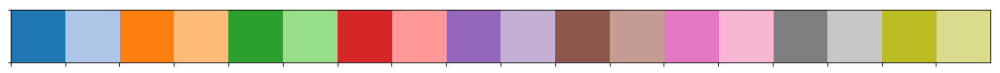

In [113]:
palette = sns.color_palette(palette='tab20', n_colors=len(large_cliques)+1)

sns.palplot(palette)
print('  ', '  ||  '.join([str(i) for i in list(range(1,len(partition)+1))]))

/anaconda3/envs/Biblio/lib/python3.7/site-packages/networkx/drawing/nx_pylab.py:611: MatplotlibDeprecationWarning: isinstance(..., numbers.Number)
  if cb.is_numlike(alpha):


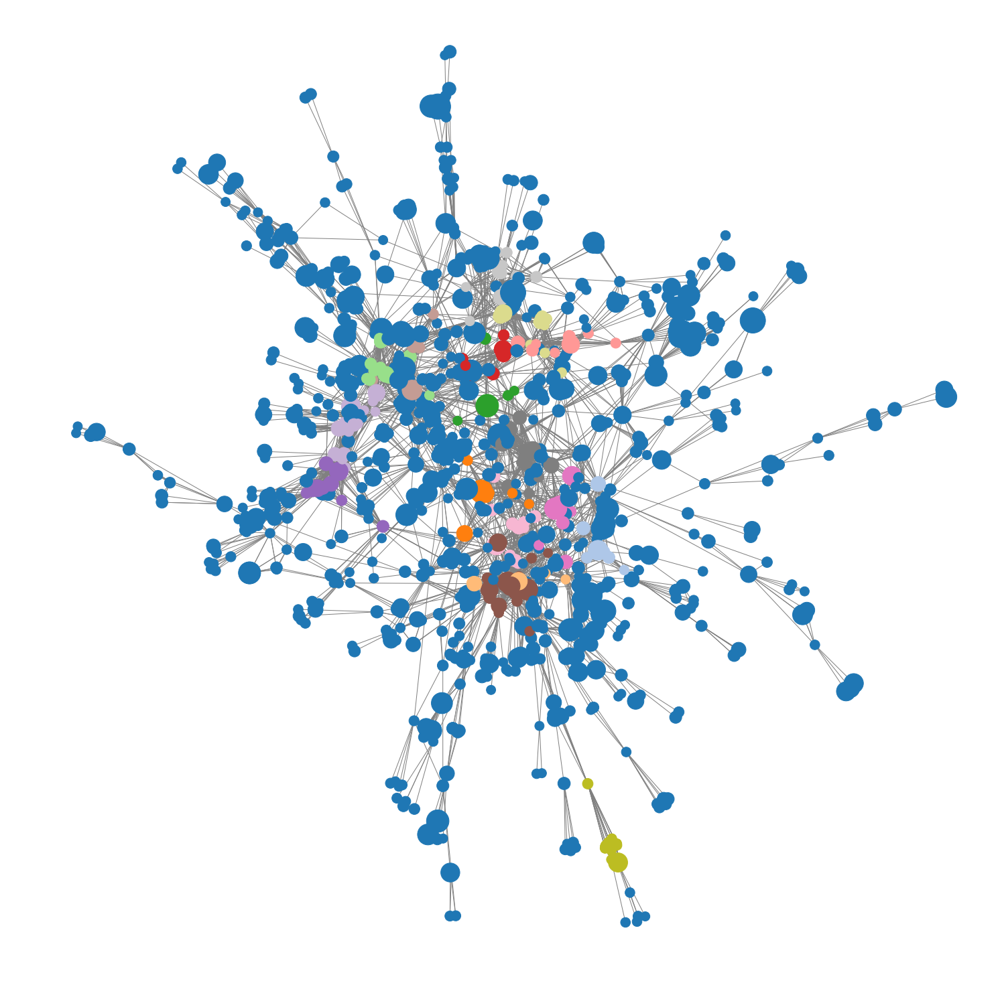

In [114]:
plt.figure(figsize=(20, 20))
nx.draw_spring(main_component, node_color=pd.Series(color_cliques).sort_index().tolist(), 
              cmap=ListedColormap(palette.as_hex()),
              node_size=(node_size+node_size.mean())*6000,
               edge_color='grey',
               iterations=400
              )

In [115]:
color = {}
for i, clique in enumerate(large_cliques):
    for member in clique:
        color[member] = i+2

/anaconda3/envs/Biblio/lib/python3.7/site-packages/networkx/drawing/nx_pylab.py:611: MatplotlibDeprecationWarning: isinstance(..., numbers.Number)
  if cb.is_numlike(alpha):


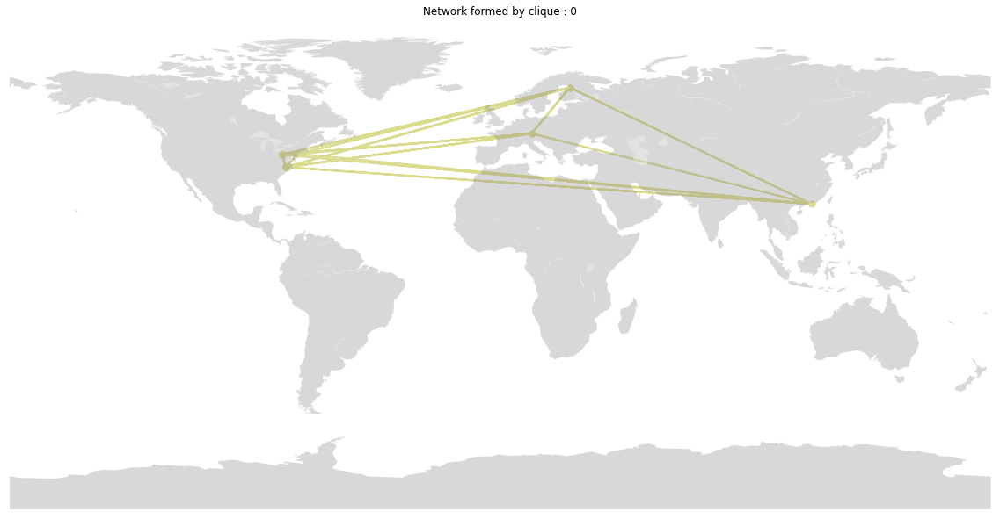

['Fischer, Frank', 'Stegmann, Karsten', 'Azevedo, Roger', 'Mudrick, Nicholas', 'Taub, Michelle', 'Martin, Seth A.', 'Malmberg, Jonna', 'Farnsworth, Jesse', 'Mu, Jin', 'Järvenoja, Hanna', 'Yang, Diyi', 'Järvelä, Sanna', 'Rosé, Carolyn', 'Wen, Miaomiao', 'Wise, Alyssa Friend']


/anaconda3/envs/Biblio/lib/python3.7/site-packages/networkx/drawing/nx_pylab.py:611: MatplotlibDeprecationWarning: isinstance(..., numbers.Number)
  if cb.is_numlike(alpha):


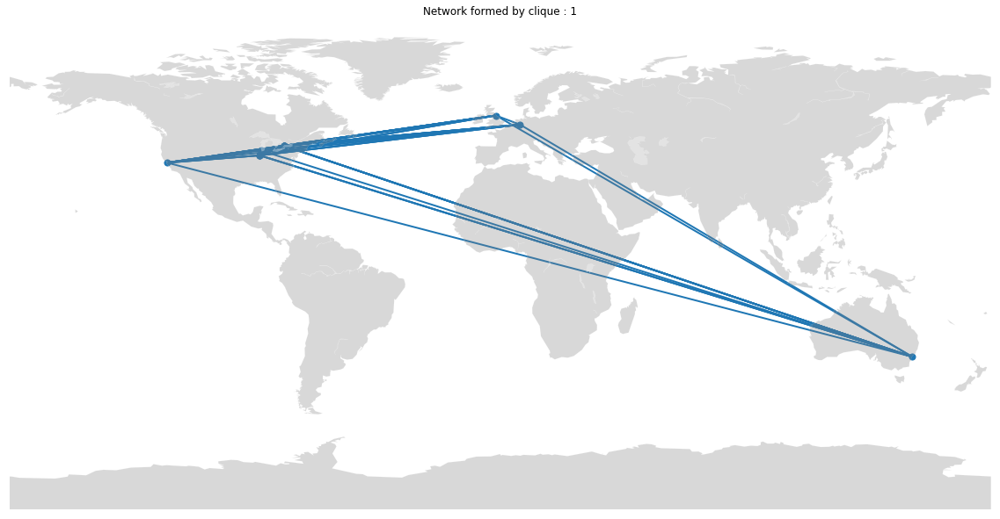

['Cober, Rebecca', 'Moher, Tom', 'Slotta, James D.', 'Fong, Cresencia', 'Mercier, Emma', 'Rummel, Nikol', 'Forssell, Karin S.', 'Israel, Maya', 'Shehab, Saadeddine', 'Joyce-Gibbons, Andrew', 'Martinez-Maldonado, Roberto', 'Messina, Richard', 'Murray, Julia', 'Peebles, Ben']


/anaconda3/envs/Biblio/lib/python3.7/site-packages/networkx/drawing/nx_pylab.py:611: MatplotlibDeprecationWarning: isinstance(..., numbers.Number)
  if cb.is_numlike(alpha):


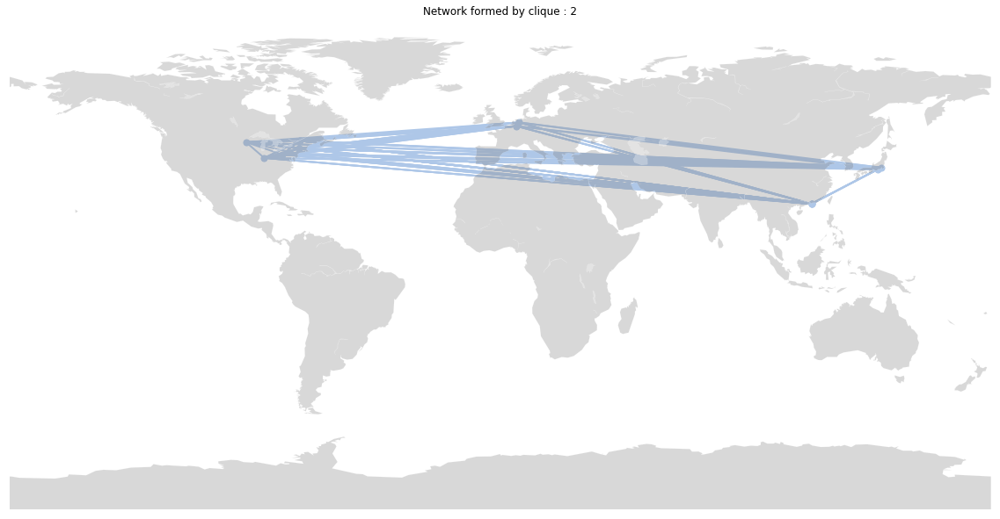

['Wise, Alyssa Friend', 'Rosé, Carolyn', 'de Jong, Frank', 'Zhang, Jianwei', 'Chen, Mei-Hwa', 'Matsuzawa, Yoshiaki', 'van Aalst, Jan', 'Chan, Carol K.K.', 'van den Ende, Joan', 'van Heijst, Hennie', 'Kirschner, Paul', 'Chen, Feng', 'Godinez, Erick Velazquez', 'Ratté, Sylvie', 'Yang, Christine', 'Silver, Cindy Hmelo', 'Oshima, Jun', 'Chen, Bodong']


/anaconda3/envs/Biblio/lib/python3.7/site-packages/networkx/drawing/nx_pylab.py:611: MatplotlibDeprecationWarning: isinstance(..., numbers.Number)
  if cb.is_numlike(alpha):


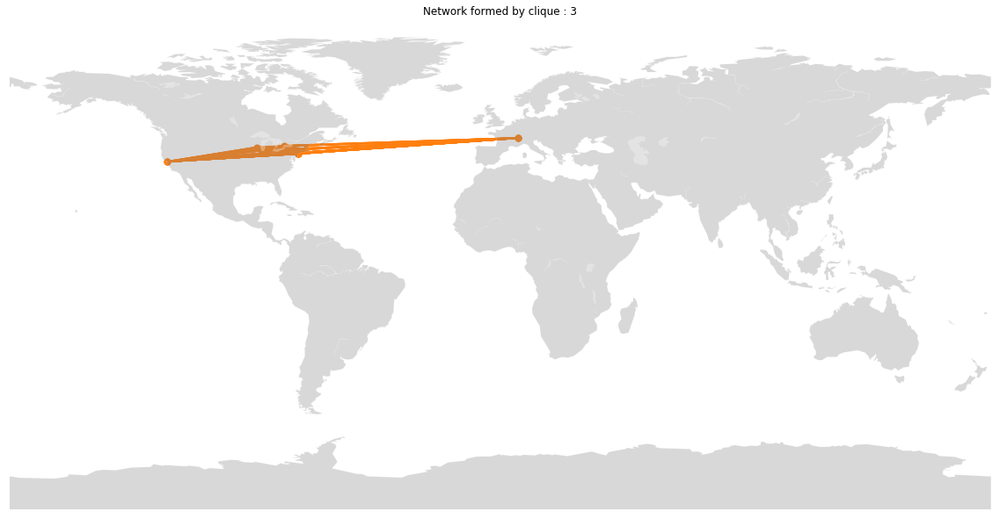

['Schwendimann, Beat A.', 'Dillenbourg, Pierre', 'Berland, Matthew', 'Lyons, Leila', 'Cocco, Felipe', 'Plass, Jan L.', 'Hajny, Nik', 'Slotta, James D.', 'Olsen, Al', 'Vitale, Jonathan', 'Boroujeni, Mina Shirvani', 'Matuk, Camillia', 'Linn, Marcia', 'Tissenbaum, Mike', 'Gerard, Libby']


/anaconda3/envs/Biblio/lib/python3.7/site-packages/networkx/drawing/nx_pylab.py:611: MatplotlibDeprecationWarning: isinstance(..., numbers.Number)
  if cb.is_numlike(alpha):


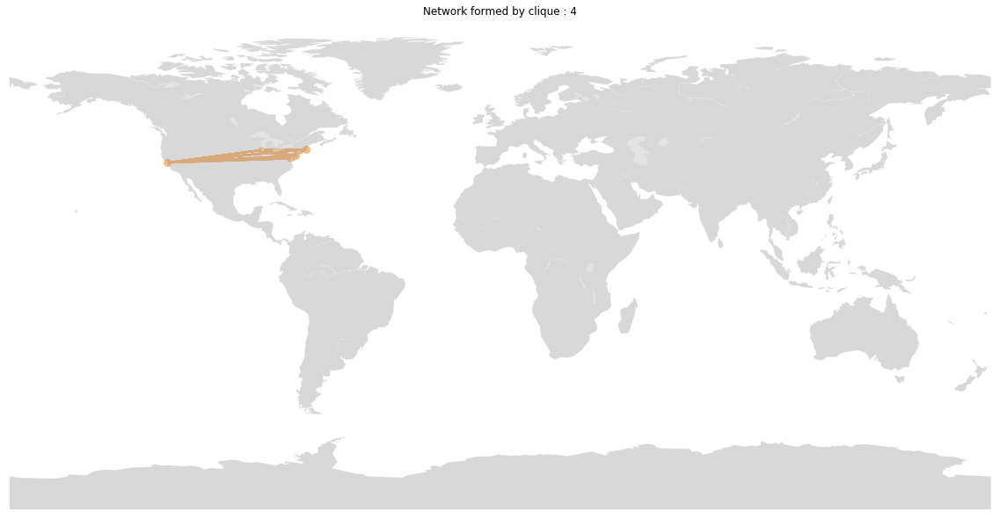

['Shapiro, R. Benjamin', 'Sherman, Mark A', 'Sheldon, Josh', 'Abelson, Hal', 'Lui, Debora', 'Lee, Irene', 'kafai, yasmin', 'Mustafaraj, Eni', 'Temple, Will', 'Weintrop, David', 'Grover, Shuchi', 'Sorensen, Clara', 'Basu, Satabdi', 'Tissenbaum, Mike', 'Jayathirtha, Gayithri', 'Shaw, Mia', 'Klopfer, Eric', 'Jona, Kemi', 'Horn, Mike', 'Wilensky, Uri', 'Rutstein, Daisy', 'Snow, Eric', 'Shear, Linda']


/anaconda3/envs/Biblio/lib/python3.7/site-packages/networkx/drawing/nx_pylab.py:611: MatplotlibDeprecationWarning: isinstance(..., numbers.Number)
  if cb.is_numlike(alpha):


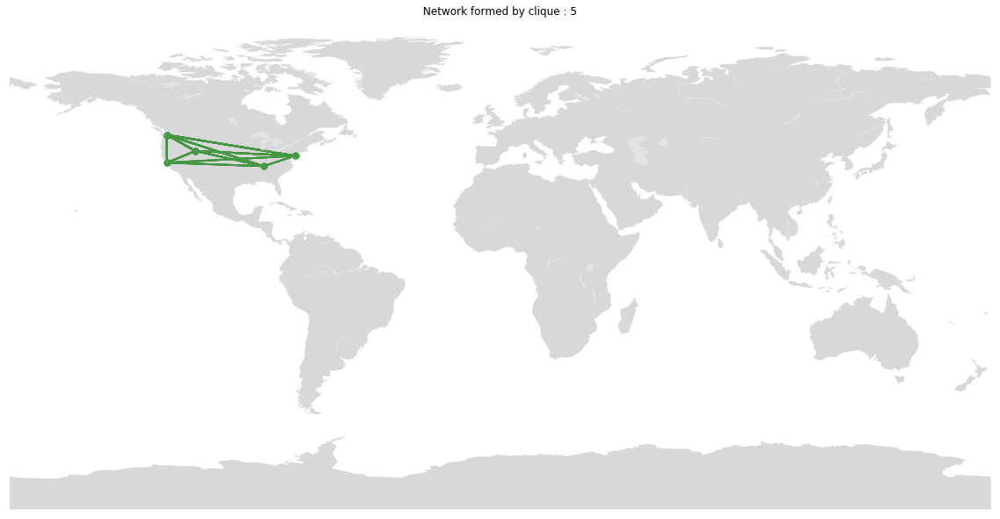

['Lee, Victor R.', 'Bell, Philip', 'Price, Nancy', 'Telhan, Orkan', 'Tzou, Carrie', 'Hall, Rogers', 'Barron, Brigid', 'Ng, Meixi', 'Adleberg, Barrie', 'Kahn, Jennifer', 'Kafai, Yasmin B.', 'Phillips, Abigail Leigh', 'Hansen, Jennifer', 'Davis, Richard Lee', 'Stromholt, Shelley', 'Bang, Megan', 'Recker, Mimi']


/anaconda3/envs/Biblio/lib/python3.7/site-packages/networkx/drawing/nx_pylab.py:611: MatplotlibDeprecationWarning: isinstance(..., numbers.Number)
  if cb.is_numlike(alpha):


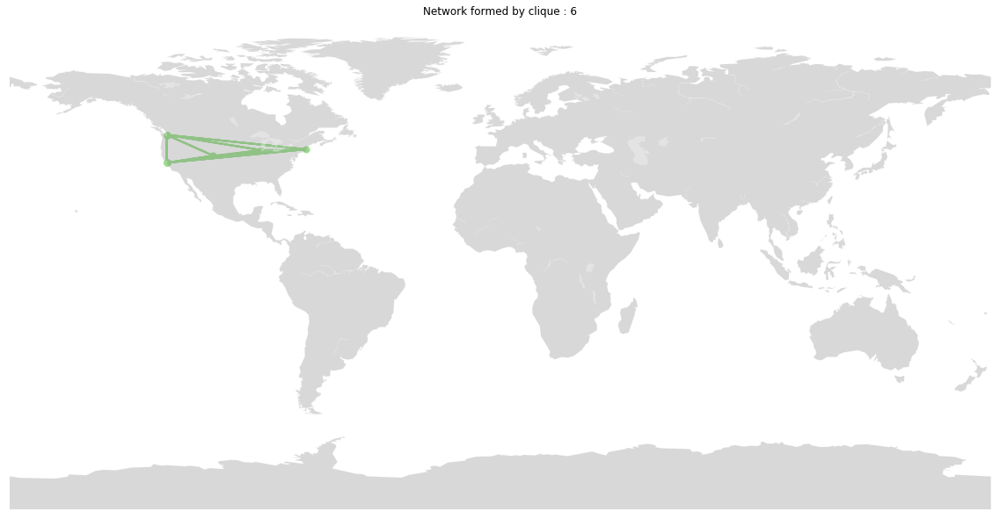

['Bell, Philip', 'Bang, Megan', 'Tzou, Carrie', 'Barron, Brigid', 'Suárez, Enrique', '*, Meixi', 'Pinkard, Nichole', 'McDermott, Raymond', 'Goldman, Shelley', 'Luce, Megan', 'Vea, Tanner', 'Conlin, Luke', 'Martin, Caitlin Kennedy', 'Roque, Ricarose']


/anaconda3/envs/Biblio/lib/python3.7/site-packages/networkx/drawing/nx_pylab.py:611: MatplotlibDeprecationWarning: isinstance(..., numbers.Number)
  if cb.is_numlike(alpha):


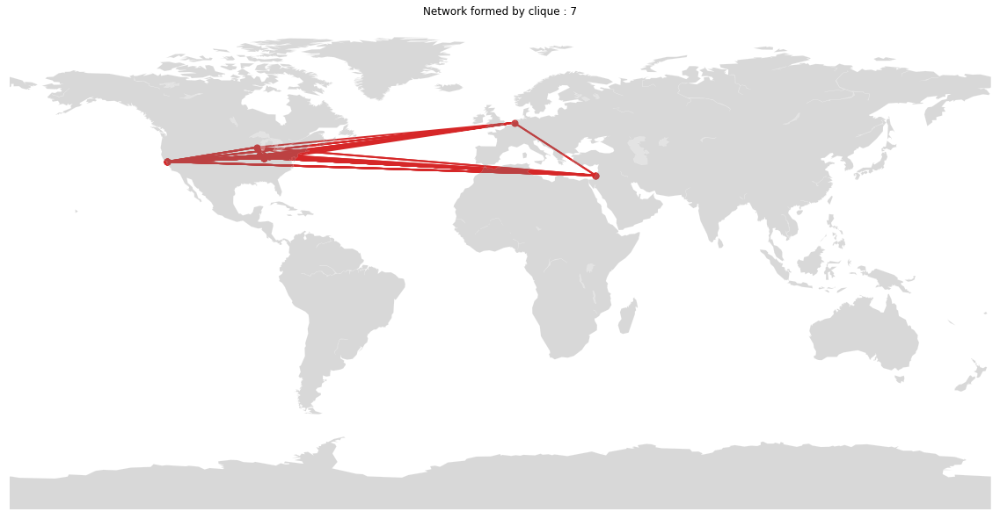

['Georgen, Chris', 'Humburg, Megan', 'Enyedy, Noel', 'Tu, Xintian', 'Davis, Bria', 'Danish, Joshua A.', 'Abrahamson, Dor', 'Brown, David', 'Maltese, Adam', 'Lindwall, Oskar', 'Bakker, Arthur', 'Andrade, Alejandro', 'Walkington, Candace A', 'Zohar, Asnat R.', 'Saleh, Asmalina', 'Dahn, Maggie', 'Lindgren, Robb', 'Nathan, Mitchell', 'Lee, Christine', 'Levy, Sharona T.']


/anaconda3/envs/Biblio/lib/python3.7/site-packages/networkx/drawing/nx_pylab.py:611: MatplotlibDeprecationWarning: isinstance(..., numbers.Number)
  if cb.is_numlike(alpha):


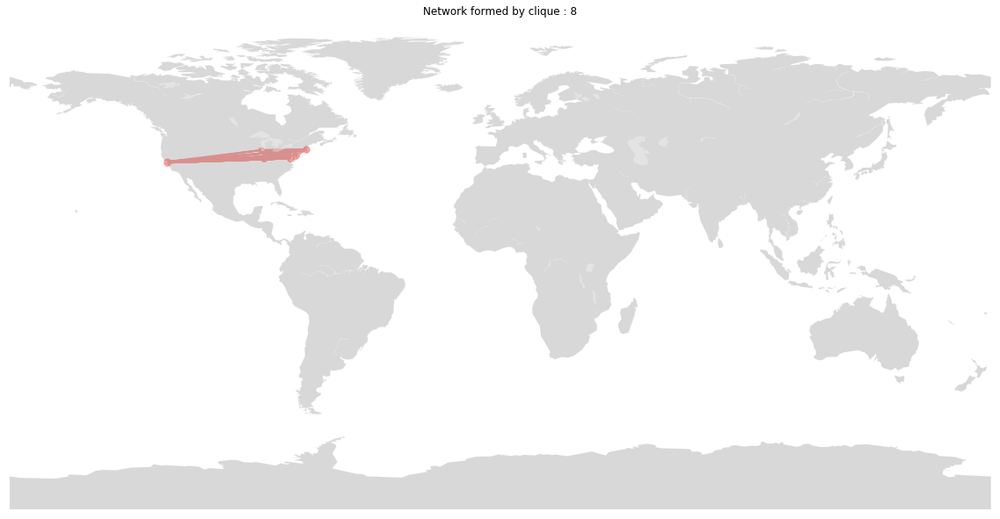

['Georgen, Chris', 'Humburg, Megan', 'Enyedy, Noel', 'Tu, Xintian', 'Davis, Bria', 'Danish, Joshua A.', 'Clegg, Tamara', 'Byrne, Virginia L', 'Lui, Debora', 'kang, Seokbin', 'Norooz, Leyla', 'Froehlich, Jon E.', 'Horn, Mike', 'Walker, Justice Toshiba', 'Washington, Peter', 'Bumbacher, Engin', 'Riedel-Kruse, Ingmar', 'Blikstein, Paulo', 'Anderson, Emma', 'kafai, yasmin']


/anaconda3/envs/Biblio/lib/python3.7/site-packages/networkx/drawing/nx_pylab.py:611: MatplotlibDeprecationWarning: isinstance(..., numbers.Number)
  if cb.is_numlike(alpha):


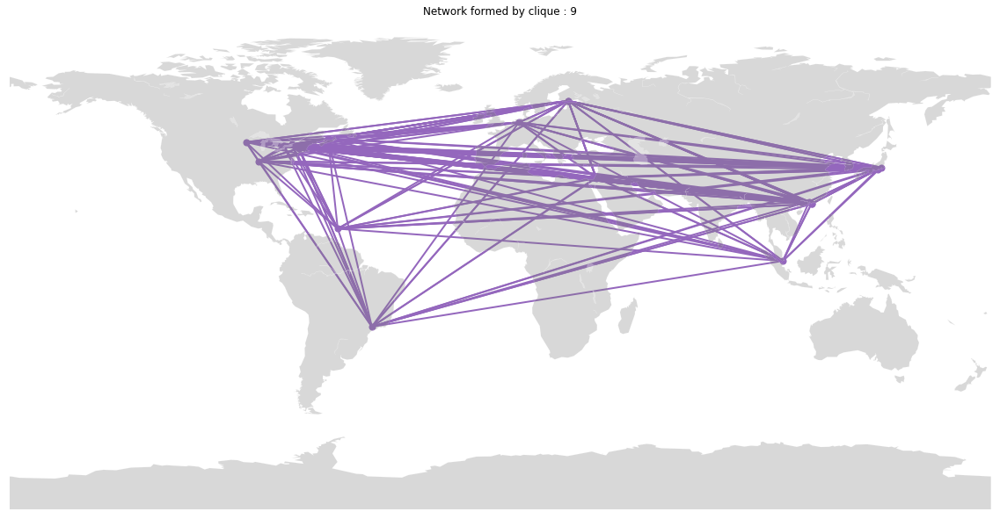

['Oshima, Jun', 'de Jong, Frank', 'van Aalst, Jan', 'Chan, Carol K.K.', 'Zhang, Jianwei', 'Chen, Mei-Hwa', 'Matsuzawa, Yoshiaki', 'Chen, Bodong', 'Shirouzu, Hajime', 'Scardamalia, Marlene', 'Seitamaa-Hakkarainen, Pirita', 'Hakkarainen, Kai', 'Laferrière, Thérèse', 'Tan, Seng Chee', 'del Castillo, Fernando Diaz', 'McAuley, Alexander', 'Montané, Mireia', 'Reeve, Richard', 'Bielaczyc, Katerine', 'Vinha, Telma', 'Nunes, Cesar', 'Teo, Chew Lee']


/anaconda3/envs/Biblio/lib/python3.7/site-packages/networkx/drawing/nx_pylab.py:611: MatplotlibDeprecationWarning: isinstance(..., numbers.Number)
  if cb.is_numlike(alpha):


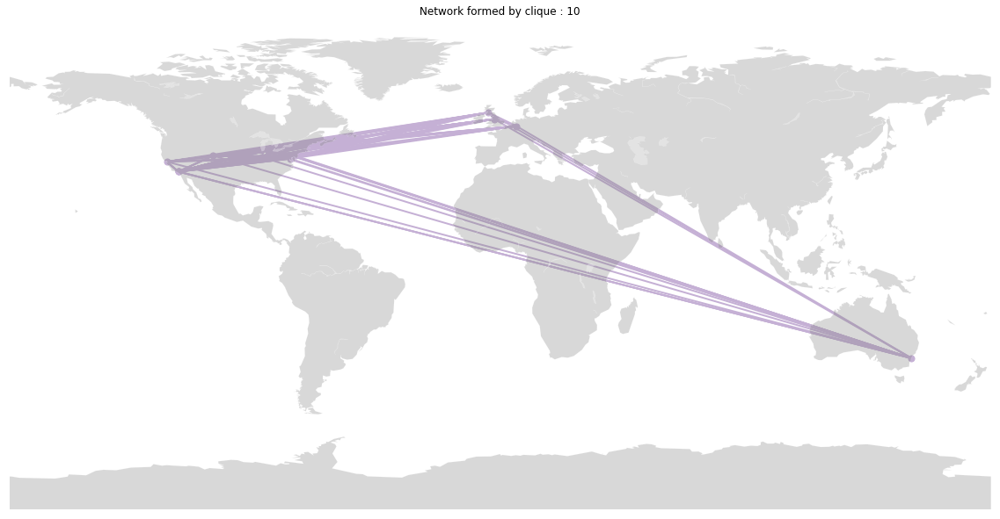

['Yoon, Susan A.', 'Santo, Rafi', 'van Amersfoort, Daniël', 'Whitfield, Latricia Chanel Whitfield', 'Shirrell, Matthew', 'Miller, Katie A', 'Anderson, Charles W', 'Frank, Kenneth A.', 'Baker-Doyle, Kira J', 'Penuel, William', 'de Laat, Maarten', 'Hopkins, Megan', 'Lin, Qinyun', 'Marshall, Stefanie Marshall', 'Nijland, Femke', 'de Freitas, Elizabeth', 'Schreurs, Bieke', 'Spillane, James']


/anaconda3/envs/Biblio/lib/python3.7/site-packages/networkx/drawing/nx_pylab.py:611: MatplotlibDeprecationWarning: isinstance(..., numbers.Number)
  if cb.is_numlike(alpha):


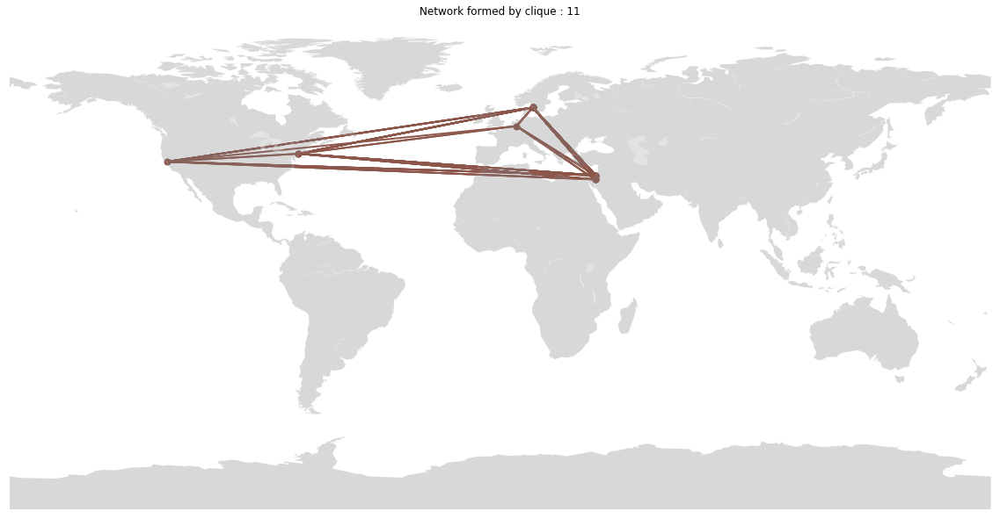

['Kali, Yael', 'Brami, Uzi Zevik', 'Hoadley, Christopher', 'Tal, Tali', 'Kidron, Adi', 'Barzilai, Sarit', 'Ben-Zvi, Dani', 'Baram-Tsabari, Ayelet', 'Kirschner, Paul', 'Weiss, Patrice L. Tamar', 'Amzalag, Meital', 'Duek, Oshra', 'Elias, Nelly', 'Kent, Carmel', 'Laslo, Esther', 'Levy, Keren S.', 'Rafaeli, Sheizaf', 'Tabak, Iris']


/anaconda3/envs/Biblio/lib/python3.7/site-packages/networkx/drawing/nx_pylab.py:611: MatplotlibDeprecationWarning: isinstance(..., numbers.Number)
  if cb.is_numlike(alpha):


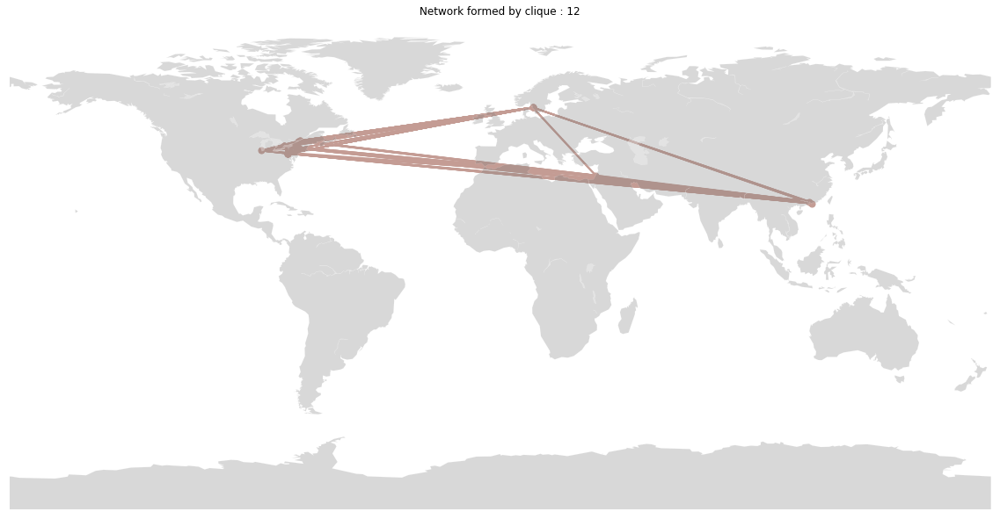

['Kali, Yael', 'Acosta, Alisa', 'Zhang, Jianwei', 'Chen, Mei-Hwa', 'Moher, Tom', 'Slotta, James D.', 'Hod, Yotam', 'Charles, Elizabeth S.', 'Ben-Zvi, Dani', 'Choi, Koun', 'Dugdale, Michael', 'Lenton, Kevin', 'McDonald, Scott', 'Quintana, Rebecca', 'Rook, Michael M.', 'Tietjen, Phil', 'Whittaker, Chris', 'Bielaczyc, Katerine', 'Kapur, Manu', 'Weiss, Patrice L. Tamar']


/anaconda3/envs/Biblio/lib/python3.7/site-packages/networkx/drawing/nx_pylab.py:611: MatplotlibDeprecationWarning: isinstance(..., numbers.Number)
  if cb.is_numlike(alpha):


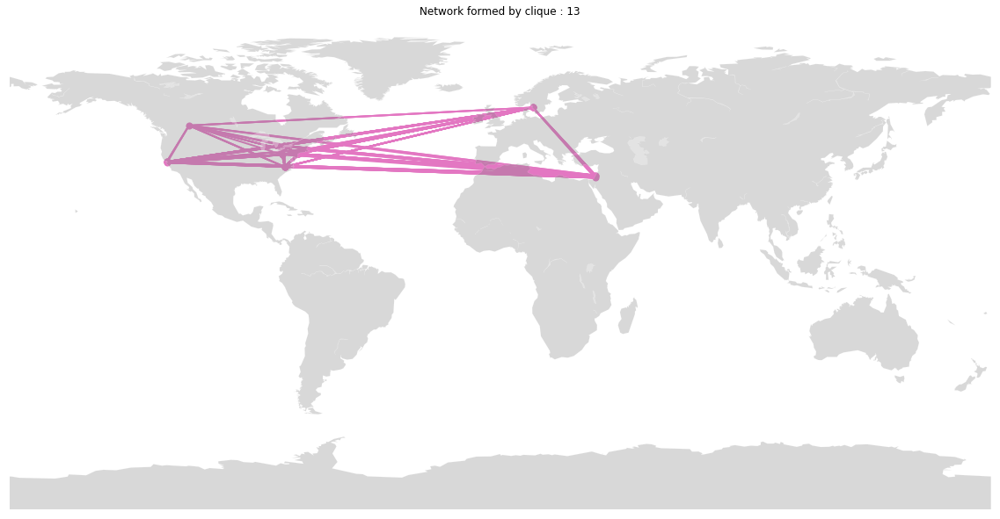

['Kali, Yael', 'Acosta, Alisa', 'Tal, Tali', 'Kidron, Adi', 'Swearingen, Amanda', 'Clark, Doug', 'Virk, Satyugjit', 'Barnes, Jackie', 'Adams, Deanne', 'Sarmiento, Juan Pablo', 'Ben-Horin, Hava', 'Chiu, Jennifer', 'Bywater, Jim P', 'Hong, James', 'Hovey, Christopher M', 'Linn, Marcia', 'Matuk, Camillia', 'Osborne, Jonathan', 'Laurillard, Dianna', 'Hurwich, Talia A', 'Gerard, Libby', 'Slotta, Jim', 'Bedell, Kristin Dana Bedell', 'Eylon, Bat-Sheva', 'Toutkoushian, Emily', 'Ryoo, Kihyun “Kelly”', 'Sagy, Ornit']


/anaconda3/envs/Biblio/lib/python3.7/site-packages/networkx/drawing/nx_pylab.py:611: MatplotlibDeprecationWarning: isinstance(..., numbers.Number)
  if cb.is_numlike(alpha):


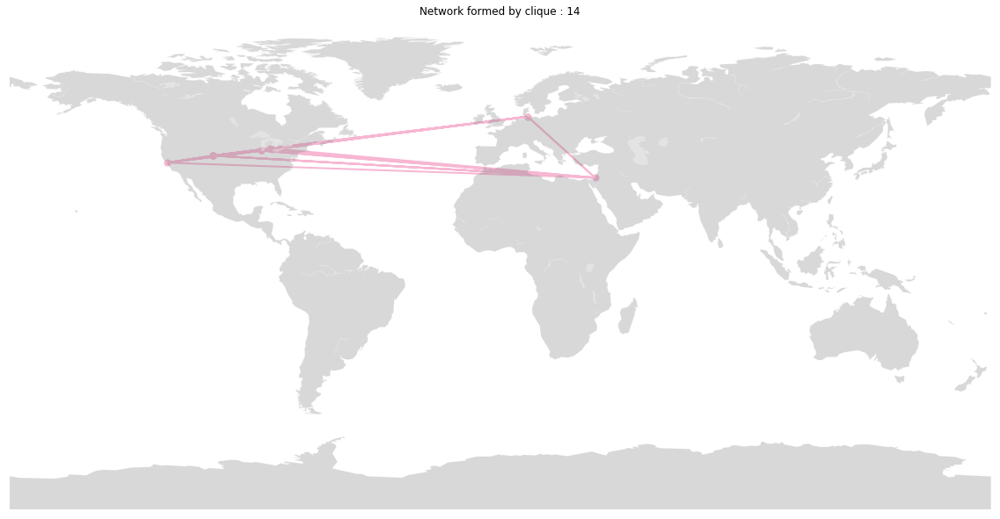

['Pellegrino, James W', 'Gane, Brian Douglas', 'Fortus, David', 'Zaidi, Sania Zahra', 'Pennock, Phyllis Haugabook', 'Briggs, Derek', 'Chattergoon, Rajendra', 'Wingert, Kerri', 'Krajcik, Joe', 'Severance, Samuel', 'Harris, Christopher J.', 'Penuel, William', 'Furtak, Erin Marie', 'Van Horne, Katie', 'Nordine, Jeffrey', 'Neumann, Knut']


/anaconda3/envs/Biblio/lib/python3.7/site-packages/networkx/drawing/nx_pylab.py:611: MatplotlibDeprecationWarning: isinstance(..., numbers.Number)
  if cb.is_numlike(alpha):


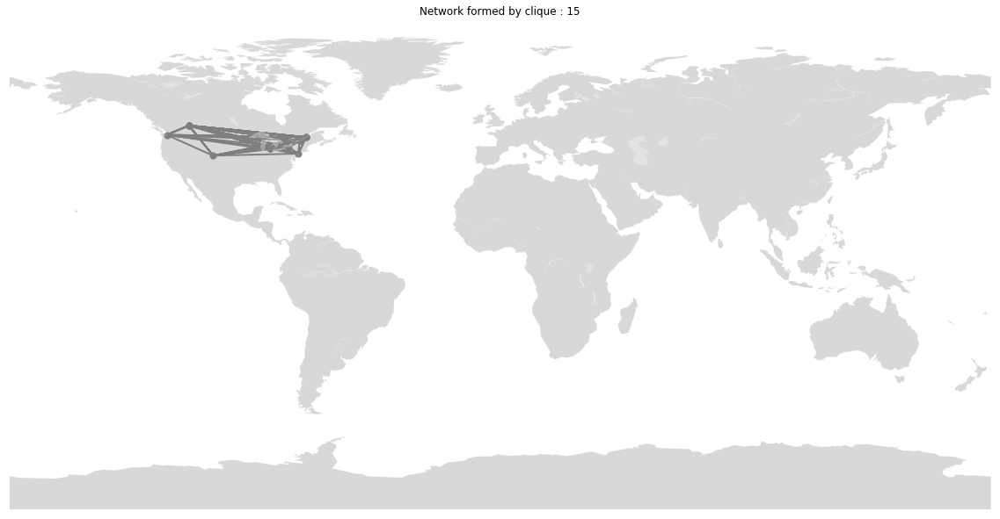

['Barton, Angela Calabrese', 'Sengupta, Pratim', 'Adams, Jennifer D', 'Barma, Sylvie', 'Vincent, Marie-Caroline', 'Voyer, Samantha', 'Rahm, Jrene', 'Touioui, Ferdous', 'Shanahan, Marie-Claire', 'Hladik, Stephanie', 'Paré, Dylan', 'Chaffee, Rachel', 'Luehmann, April', "O'Connor, Kevin", 'Greenberg, Day', 'Thompson, Jessica', 'Haganah, Sara']


/anaconda3/envs/Biblio/lib/python3.7/site-packages/networkx/drawing/nx_pylab.py:611: MatplotlibDeprecationWarning: isinstance(..., numbers.Number)
  if cb.is_numlike(alpha):


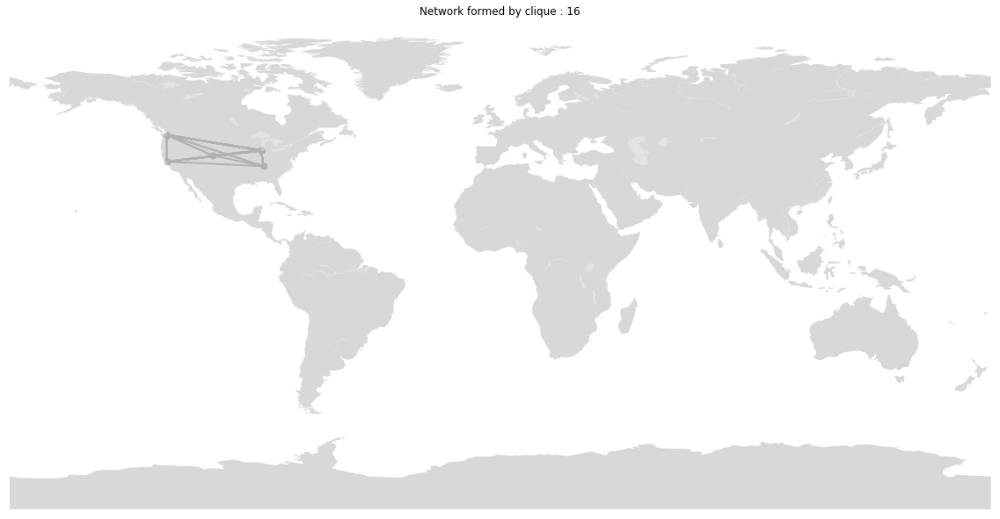

['Hall, Rogers', 'Bang, Megan', 'Radinsky, Josh', 'Melendez, Jose W.', 'Marin, Ananda Maria', 'Nolan, Charlene Montano', 'Phillips, Nathan C', 'Lund, Virginia Killian', 'Jurow, A. Susan', 'Gonzales, Wendy', 'Allen, Shawndra', 'Vossoughi, Shirin', 'Bild, David', 'Bruton, Ilana', 'Schmidt, Ani']


In [116]:

 
# prepare a color for each point depending on the continent.

 
# Add a point per position
for i, clique in enumerate(large_cliques):
    plt.figure(figsize=(20, 20))
    m=Basemap()
    m.drawmapboundary(linewidth=0)
    m.fillcontinents(color='grey', alpha=0.3)
    m.drawcoastlines(linewidth=0.1, color="white")
    data = nodes.iloc[list(clique)].copy()
    m.scatter(data['Lon'], data['Lat'], s= 50, c= palette.as_hex()[i-1], alpha=1)


    embedding = nodes.iloc[list(clique)].apply(lambda x: [x.Lon, x.Lat], axis=1)
    nx.draw_networkx_edges(main_component.subgraph(clique),  pos = embedding, 
                           edge_color=palette.as_hex()[i-1], width = 2)
    plt.title('Network formed by clique : {}'.format(i))
    plt.show()
    print(data.long_name.tolist())
    


# Using modularity to identify communities:

In [117]:
mapping = nodes.long_name.to_dict()

c = list(greedy_modularity_communities(main_component))

We change the node size based on degree centrality, the larger the node the more collaborations the individual has:

In [118]:
member_label = matching_by_criteria(c)
nx.set_node_attributes(main_component, member_label, 'community')
node_colors = pd.Series(member_label).sort_index().tolist()
node_size = np.array(list(nx.degree_centrality(main_component).values()))

In [119]:
node_size.mean()

0.009017299356467074

In [120]:
node_size.max()

0.0566873339238264

In [121]:
np.percentile(node_size, 95)

0.025686448184233837

We label the  nodes with the largest centrality:

In [122]:
labels = nodes.iloc[list(largest_cc)]#
labels = labels.iloc[np.where(node_size >= np.percentile(node_size, 99))].long_name.to_dict()

In [123]:
labels

{38: 'Slotta, James D.',
 39: 'Acosta, Alisa',
 80: 'Bell, Philip',
 96: 'Zhang, Jianwei',
 97: 'Chen, Mei-Hwa',
 119: 'Danish, Joshua A.',
 145: 'Kali, Yael',
 178: 'Rummel, Nikol',
 317: 'Rosé, Carolyn',
 318: 'kafai, yasmin',
 461: 'Chan, Carol K.K.',
 597: 'Penuel, William',
 607: 'Bang, Megan',
 892: 'Kidron, Adi',
 1008: 'Horn, Mike'}

In [124]:
len(labels)

15

   1  ||  2  ||  3  ||  4  ||  5  ||  6  ||  7  ||  8  ||  9  ||  10  ||  11  ||  12  ||  13  ||  14  ||  15  ||  16  ||  17  ||  18


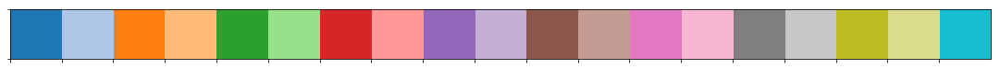

In [125]:
palette = sns.color_palette(palette='tab20', n_colors=len(c)+1)

sns.palplot(palette)
print('  ', '  ||  '.join([str(i) for i in list(range(1,len(c)+1))]))

/anaconda3/envs/Biblio/lib/python3.7/site-packages/networkx/drawing/nx_pylab.py:611: MatplotlibDeprecationWarning: isinstance(..., numbers.Number)
  if cb.is_numlike(alpha):


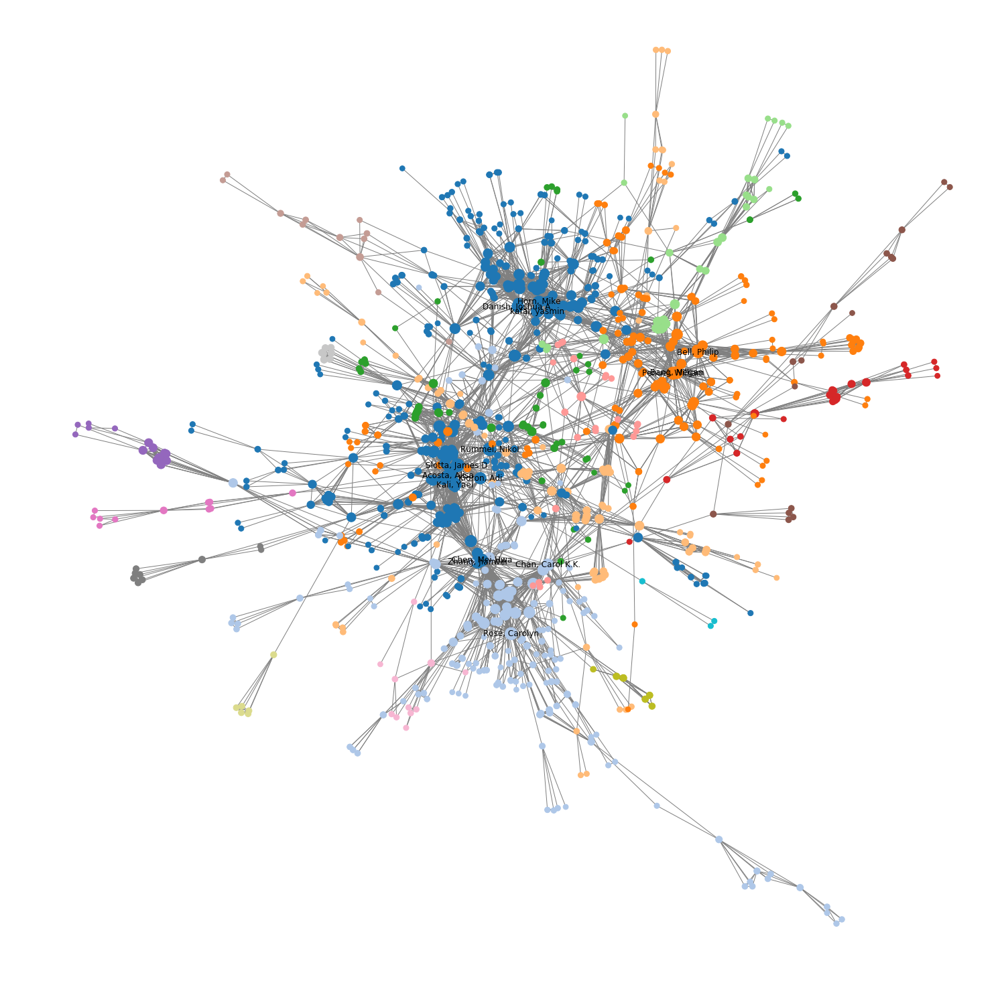

In [126]:
plt.figure(figsize=(20, 20))

nx.draw_spring(main_component, node_color=node_colors, 
                       cmap=ListedColormap(palette.as_hex()),
                       node_size=(node_size+node_size.mean())*6000,
                       labels=labels,
               edge_color='grey',
               iterations=400
              )

Here we have to code that allows to load this graph in Gephi.

In [127]:
nx.set_node_attributes(main_component, nodes.country.to_dict(), name='country')
nx.set_node_attributes(main_component, nodes.name.to_dict(), name='uni')
nx.set_node_attributes(main_component, nx.degree_centrality(graph), name='centrality')

#mapping = nodes.long_name.to_dict()
#main_component_names =nx.relabel_nodes(main_component,mapping)
#nx.write_gexf(H, 'data/main_coauthor_graph.gexf')
#nx.write_gpickle(main_component_names, 'data/coauthor_graph')

### Analyzing each subcomponent

We look at distribution of country and inst. inside these clusters (my it's associated members):

In [128]:
c = [x for x in c if len(x) > 20]

Cluster dist for cluster 1


/anaconda3/envs/Biblio/lib/python3.7/site-packages/networkx/drawing/nx_pylab.py:611: MatplotlibDeprecationWarning: isinstance(..., numbers.Number)
  if cb.is_numlike(alpha):


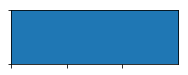

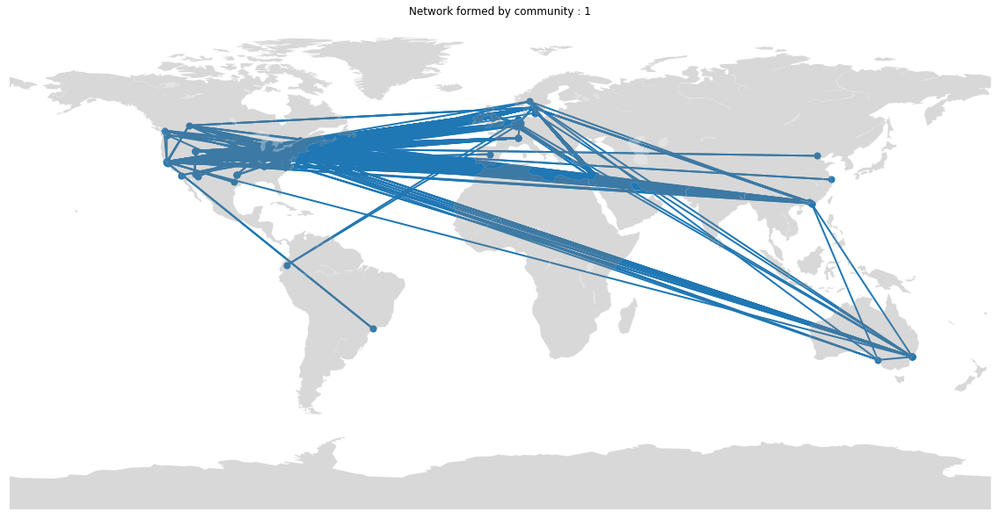

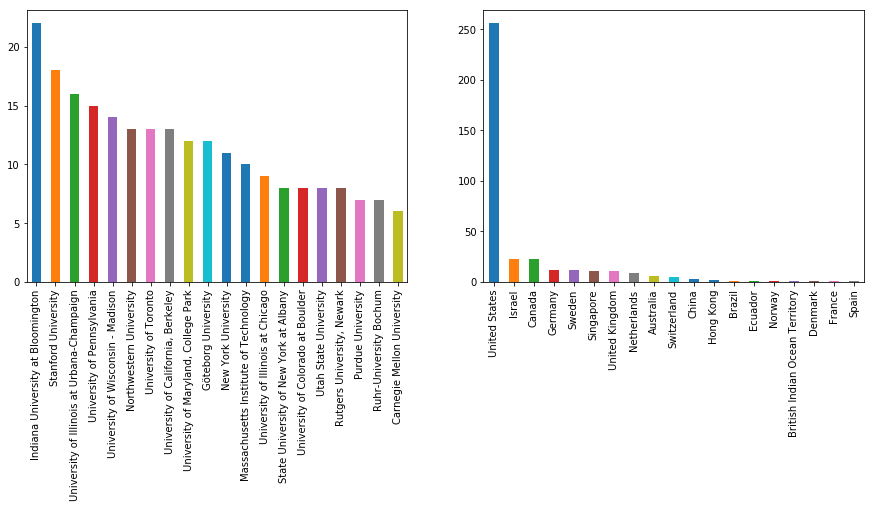

Number of countries in cluster:  19
Number of institutions in cluster:  89
Number of people in cluster:  380


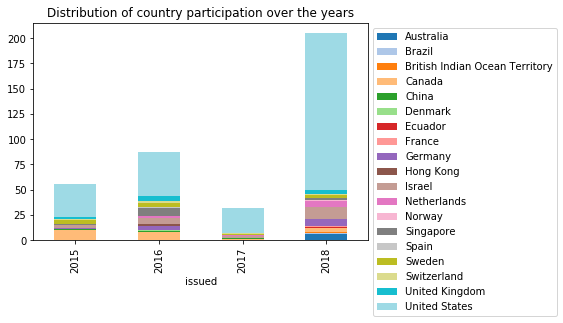

Cluster dist for cluster 2


/anaconda3/envs/Biblio/lib/python3.7/site-packages/networkx/drawing/nx_pylab.py:611: MatplotlibDeprecationWarning: isinstance(..., numbers.Number)
  if cb.is_numlike(alpha):


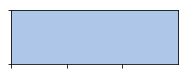

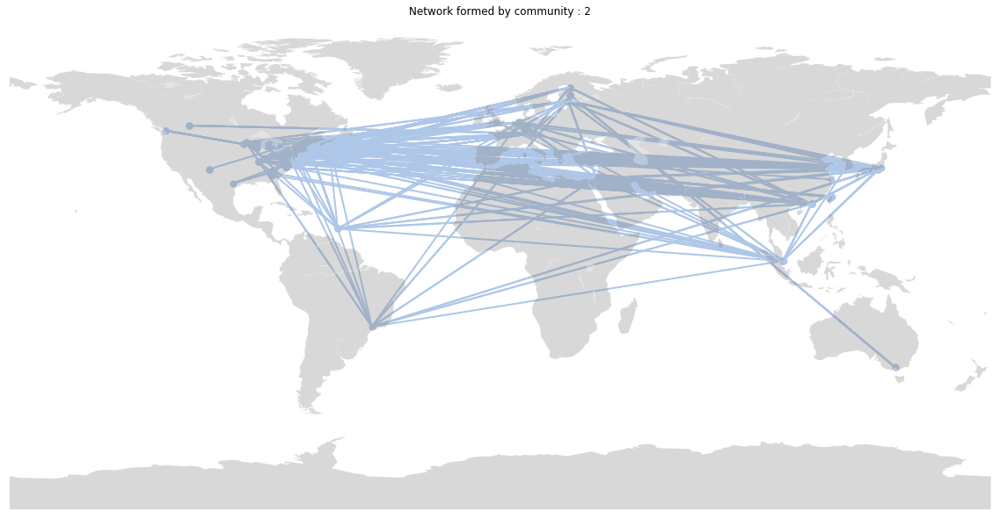

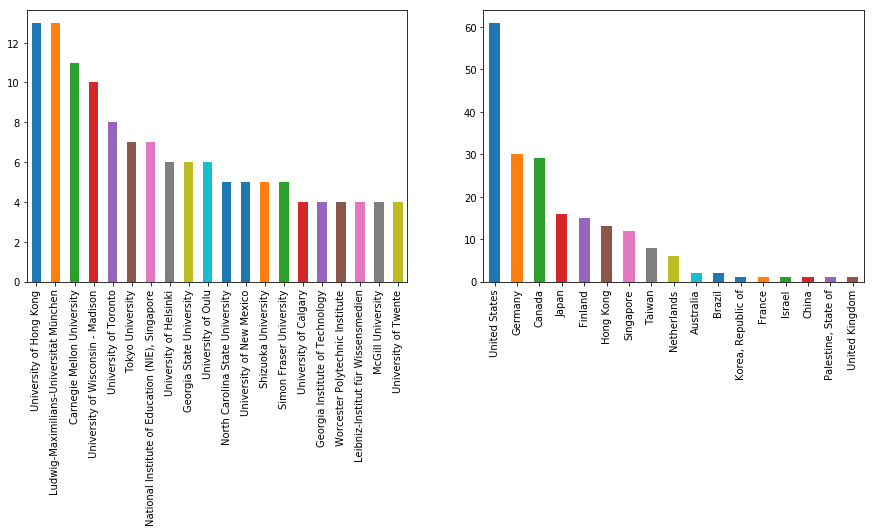

Number of countries in cluster:  17
Number of institutions in cluster:  65
Number of people in cluster:  200


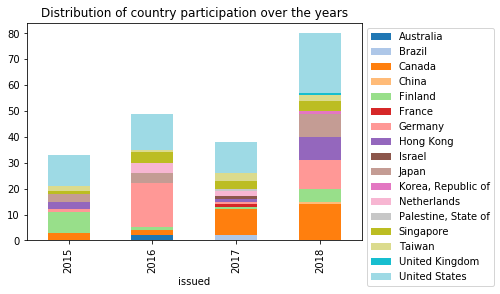

Cluster dist for cluster 3


/anaconda3/envs/Biblio/lib/python3.7/site-packages/networkx/drawing/nx_pylab.py:611: MatplotlibDeprecationWarning: isinstance(..., numbers.Number)
  if cb.is_numlike(alpha):


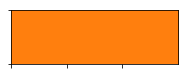

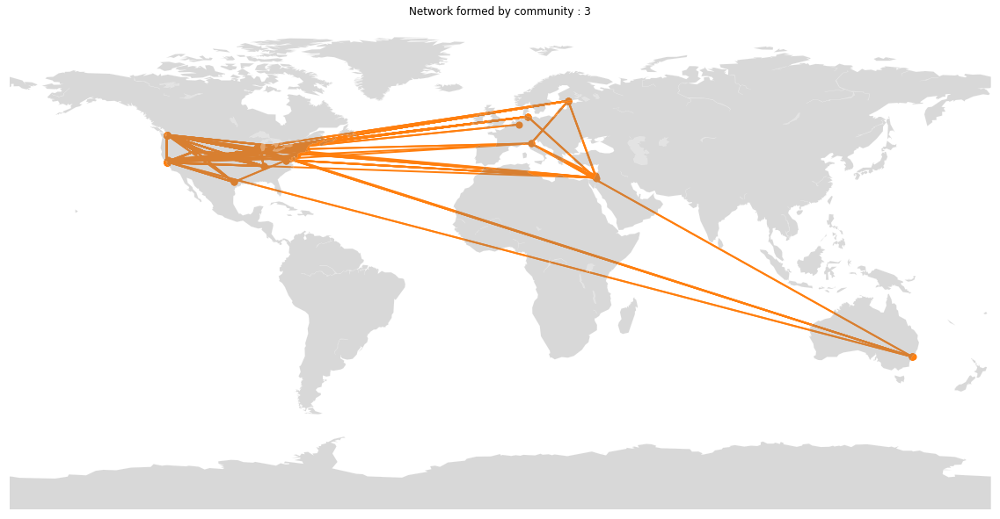

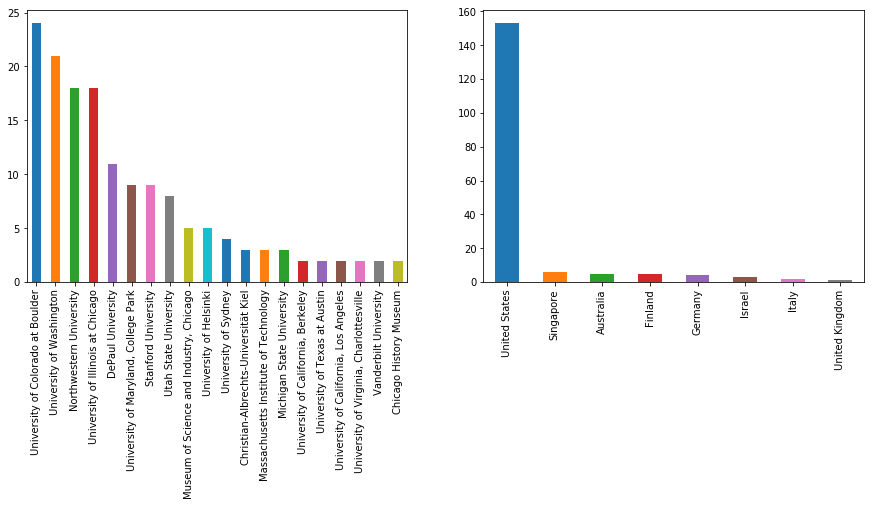

Number of countries in cluster:  8
Number of institutions in cluster:  39
Number of people in cluster:  179


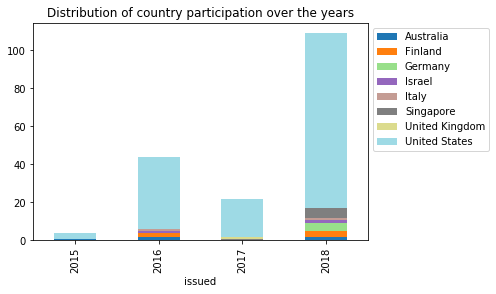

Cluster dist for cluster 4


/anaconda3/envs/Biblio/lib/python3.7/site-packages/networkx/drawing/nx_pylab.py:611: MatplotlibDeprecationWarning: isinstance(..., numbers.Number)
  if cb.is_numlike(alpha):


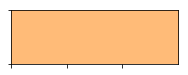

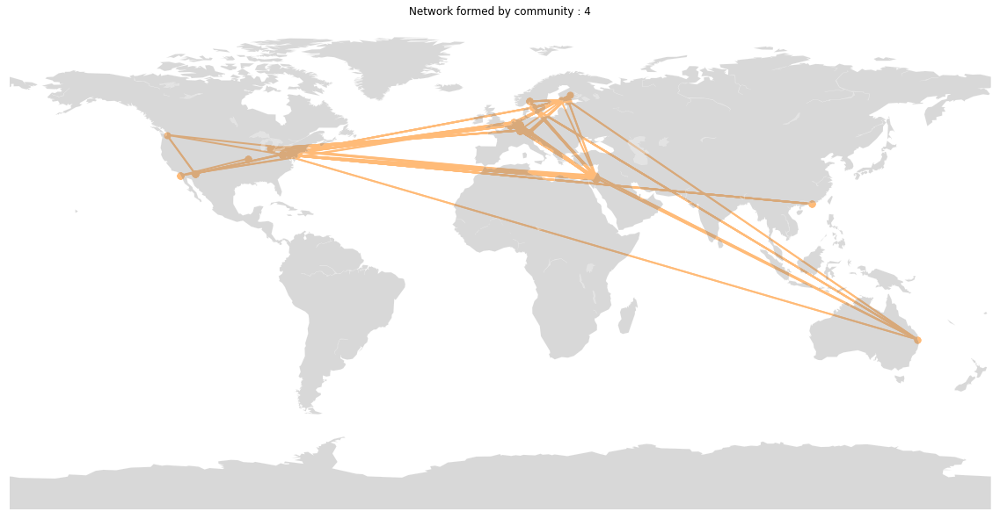

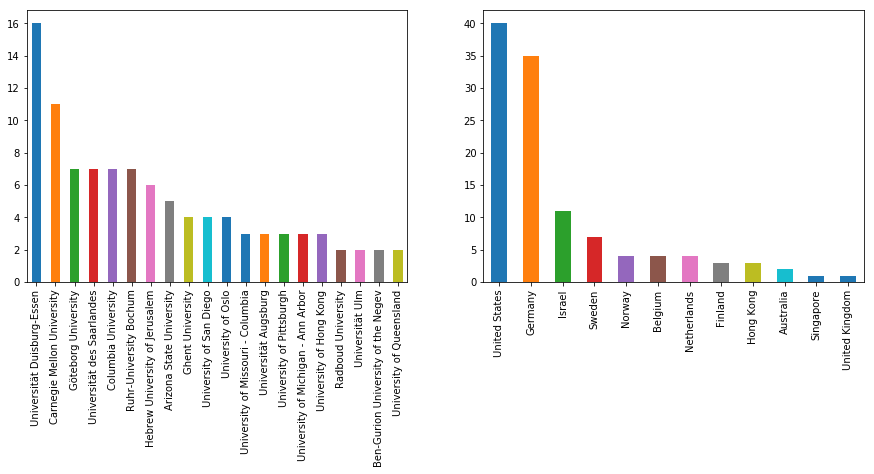

Number of countries in cluster:  12
Number of institutions in cluster:  32
Number of people in cluster:  115


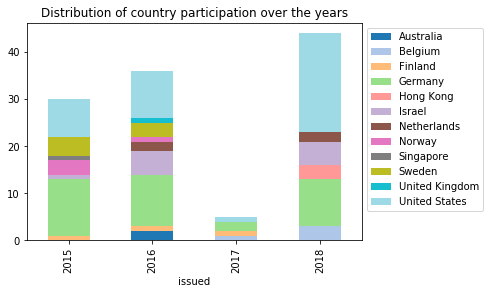

Cluster dist for cluster 5


/anaconda3/envs/Biblio/lib/python3.7/site-packages/networkx/drawing/nx_pylab.py:611: MatplotlibDeprecationWarning: isinstance(..., numbers.Number)
  if cb.is_numlike(alpha):


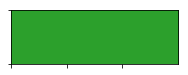

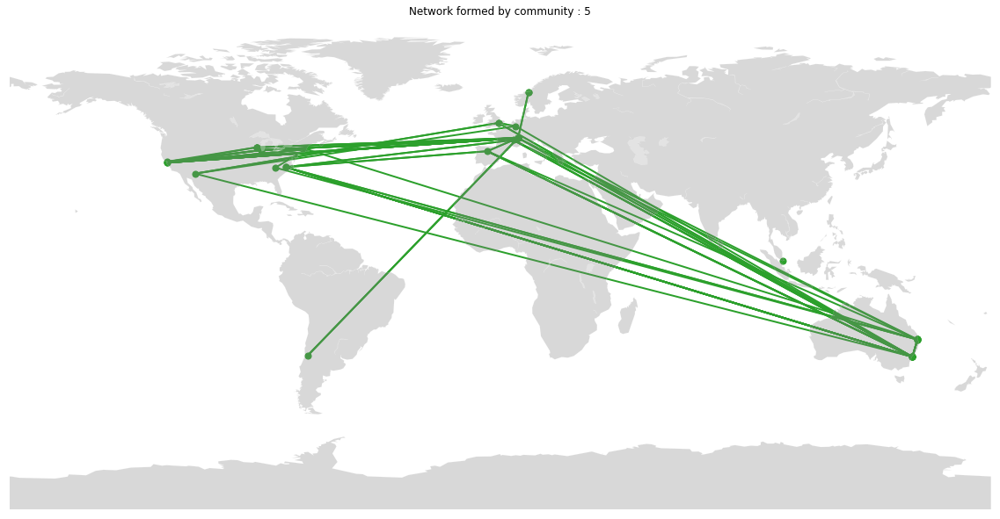

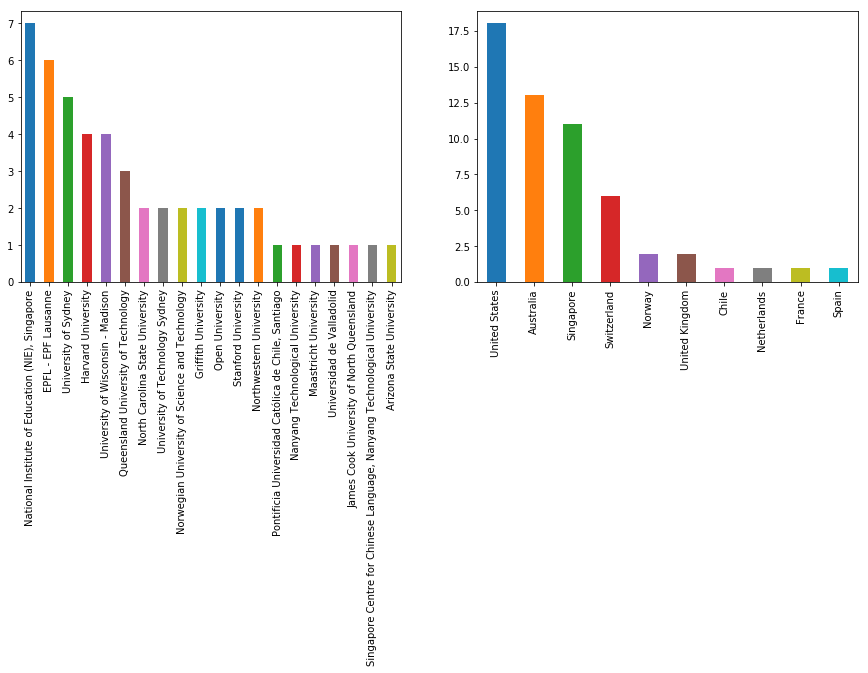

Number of countries in cluster:  10
Number of institutions in cluster:  25
Number of people in cluster:  56


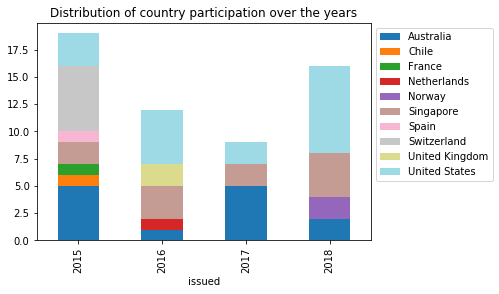

Cluster dist for cluster 6


/anaconda3/envs/Biblio/lib/python3.7/site-packages/networkx/drawing/nx_pylab.py:611: MatplotlibDeprecationWarning: isinstance(..., numbers.Number)
  if cb.is_numlike(alpha):


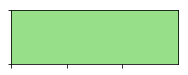

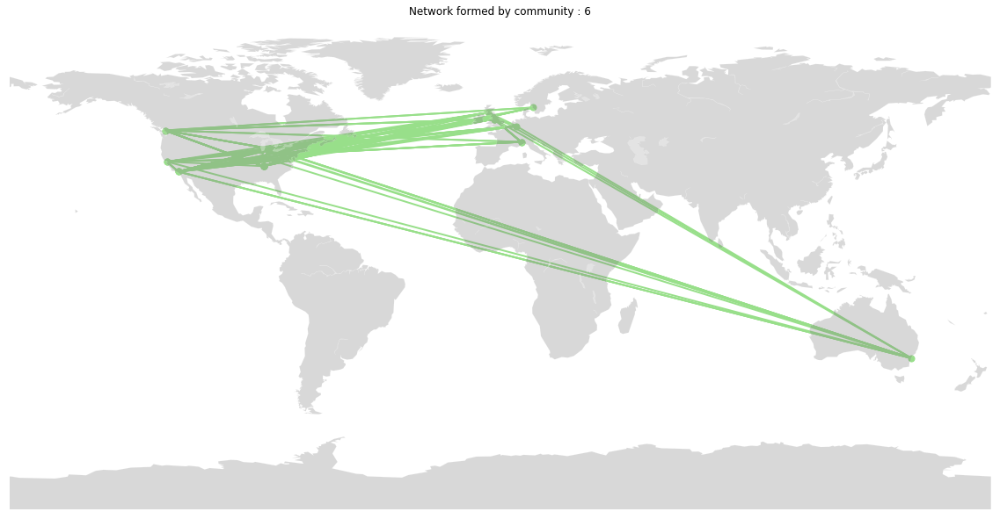

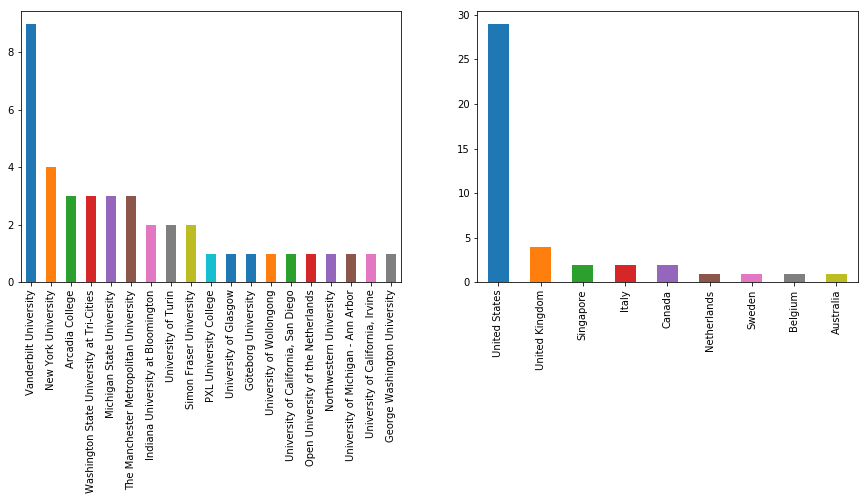

Number of countries in cluster:  9
Number of institutions in cluster:  20
Number of people in cluster:  43


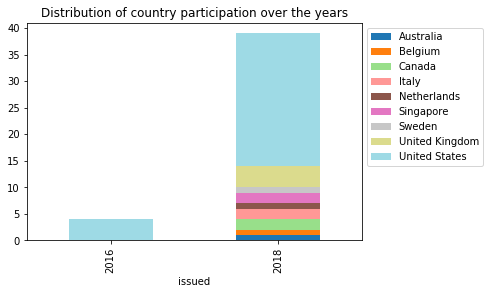

Cluster dist for cluster 7


/anaconda3/envs/Biblio/lib/python3.7/site-packages/networkx/drawing/nx_pylab.py:611: MatplotlibDeprecationWarning: isinstance(..., numbers.Number)
  if cb.is_numlike(alpha):


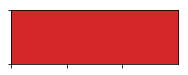

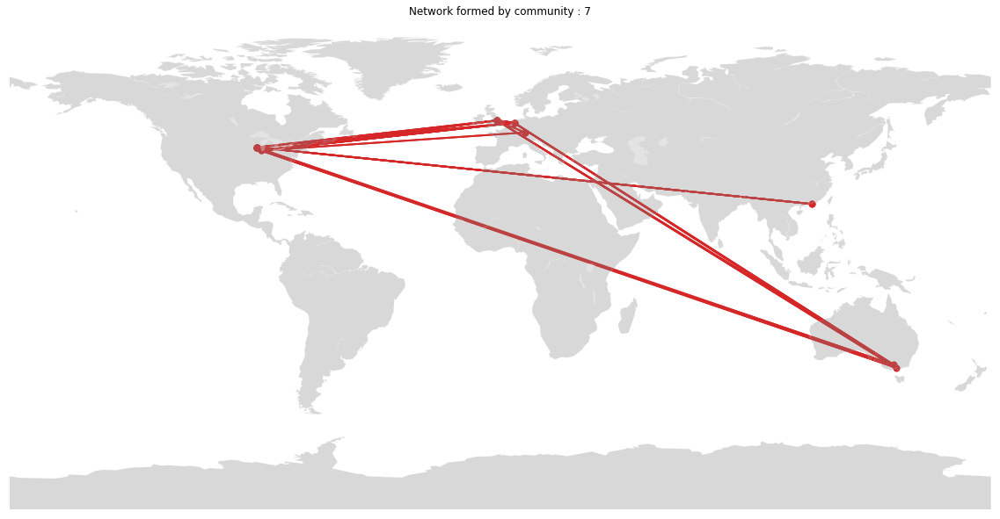

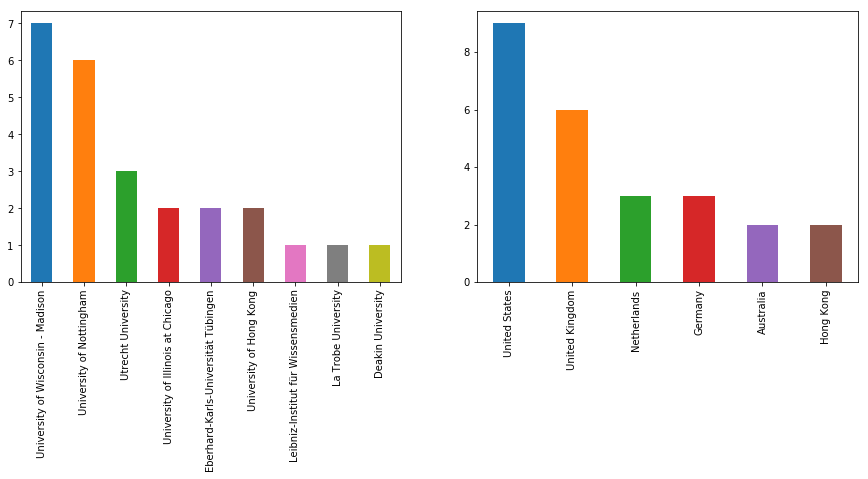

Number of countries in cluster:  6
Number of institutions in cluster:  9
Number of people in cluster:  25


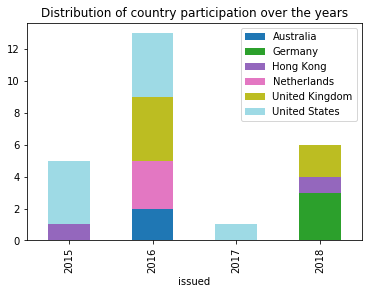

Cluster dist for cluster 8


/anaconda3/envs/Biblio/lib/python3.7/site-packages/networkx/drawing/nx_pylab.py:611: MatplotlibDeprecationWarning: isinstance(..., numbers.Number)
  if cb.is_numlike(alpha):


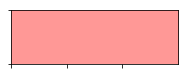

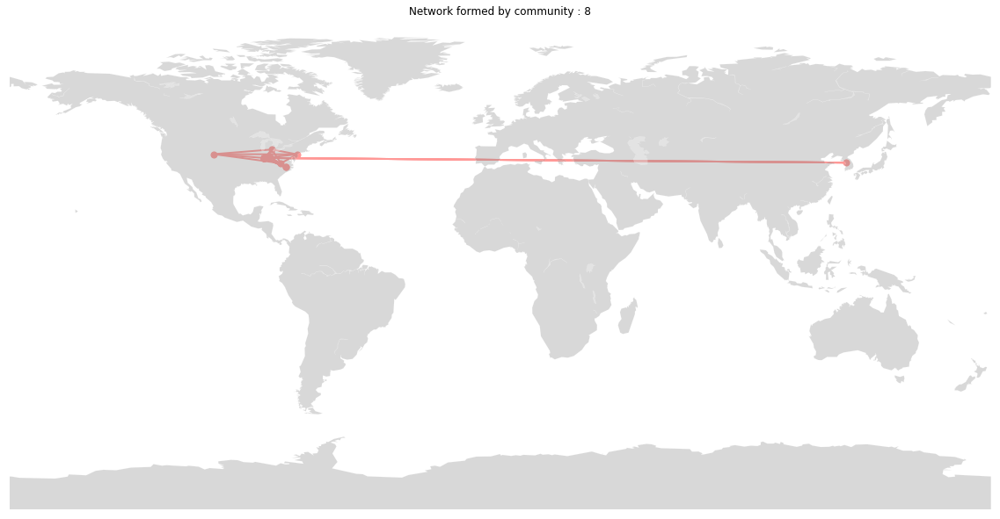

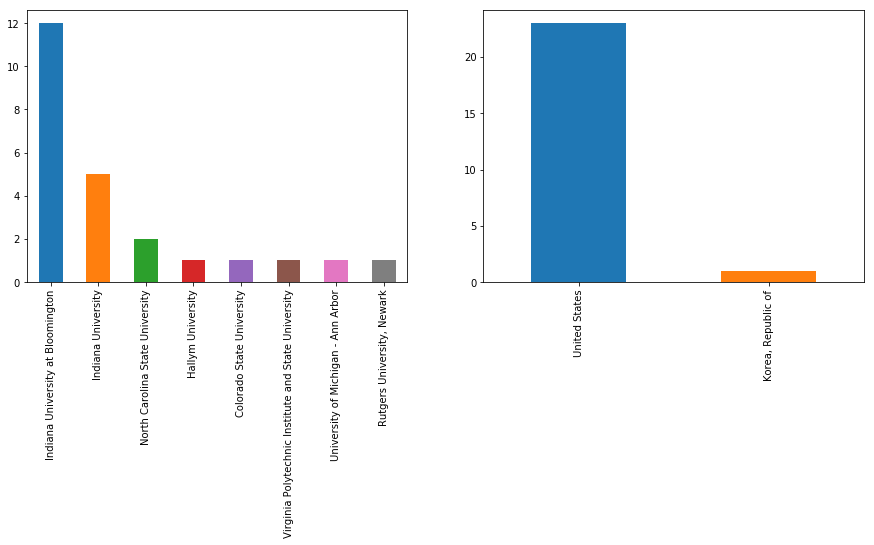

Number of countries in cluster:  2
Number of institutions in cluster:  8
Number of people in cluster:  24


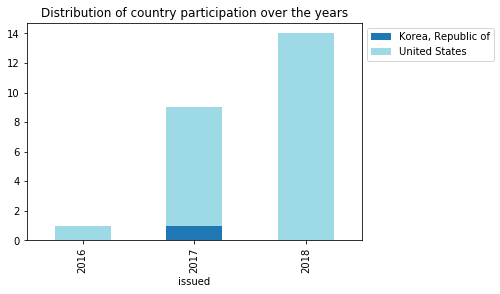

Cluster dist for cluster 9


/anaconda3/envs/Biblio/lib/python3.7/site-packages/networkx/drawing/nx_pylab.py:611: MatplotlibDeprecationWarning: isinstance(..., numbers.Number)
  if cb.is_numlike(alpha):


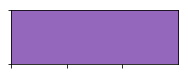

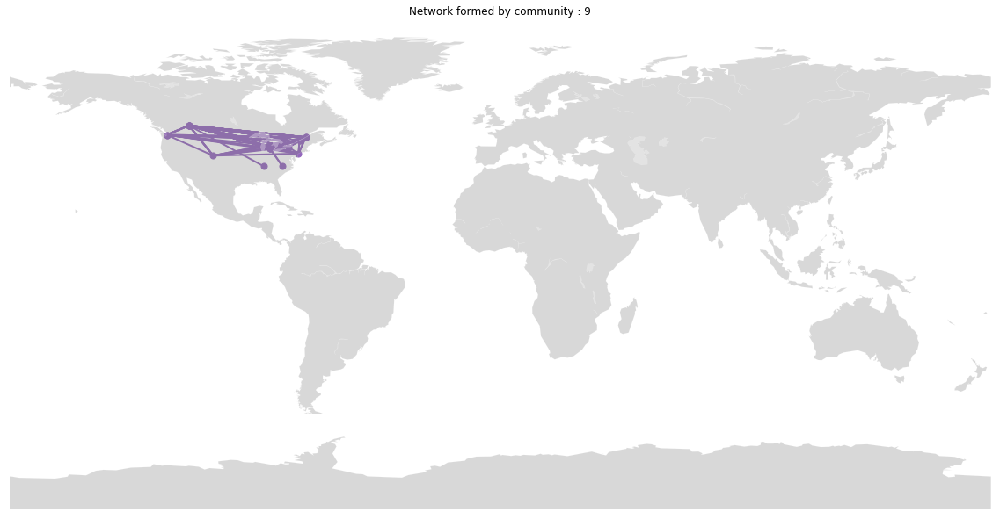

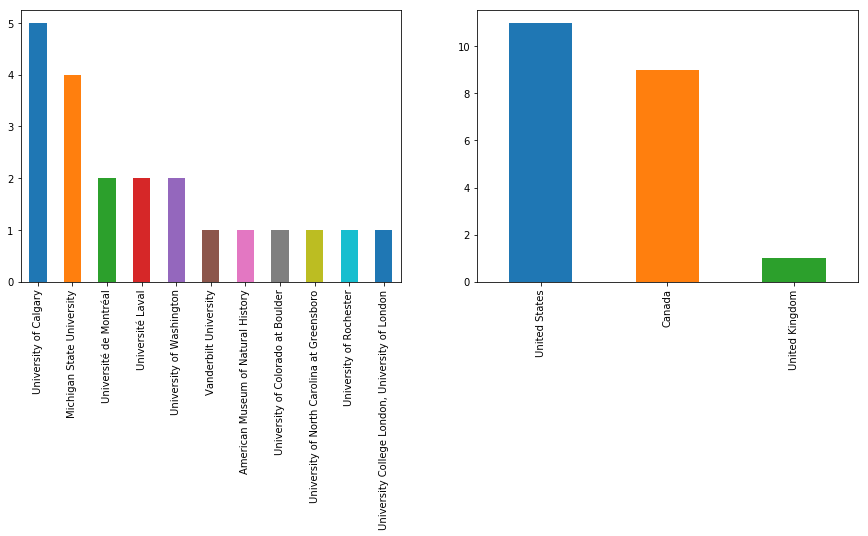

Number of countries in cluster:  3
Number of institutions in cluster:  11
Number of people in cluster:  21


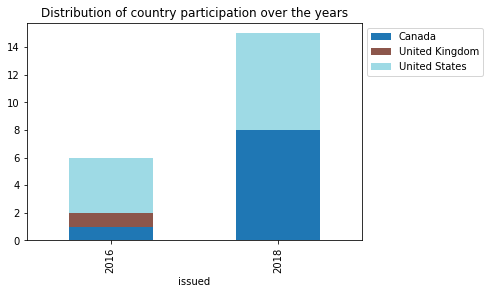

In [129]:
for i,cluster in enumerate(c):
    print(f'Cluster dist for cluster {i+1}')
    sns.palplot(palette[i])
    
    plt.figure(figsize=(20, 20))
    m=Basemap()
    m.drawmapboundary(linewidth=0)
    m.fillcontinents(color='grey', alpha=0.3)
    m.drawcoastlines(linewidth=0.1, color="white")
    data = nodes.iloc[list(cluster)].copy()
    m.scatter(data['Lon'], data['Lat'], s= 50, c= palette.as_hex()[i], alpha=1)


    embedding = nodes.iloc[list(cluster)].apply(lambda x: [x.Lon, x.Lat], axis=1)
    nx.draw_networkx_edges(main_component.subgraph(cluster),  pos = embedding, 
                           edge_color=palette.as_hex()[i], width = 2)
    plt.title('Network formed by community : {}'.format(i+1))
    plt.show()
    
    plt.figure(figsize=(15,5))
    plt.subplot(121)
    nodes.iloc[list(cluster)].name.value_counts().head(20).plot('bar')
    plt.subplot(122)
    nodes.iloc[list(cluster)].country.value_counts().head(20).plot('bar')
    plt.show()
    print('Number of countries in cluster: ', len(nodes.iloc[list(cluster)].country.unique()))
    print('Number of institutions in cluster: ', len(nodes.iloc[list(cluster)].name.unique()))
    print('Number of people in cluster: ', len(nodes.iloc[list(cluster)].long_name.unique()))
    
    #plt.title('Number of people submitting over the years over the years')
    
   
    plot_df = pd.DataFrame(nodes.iloc[list(cluster)].groupby(['issued'])\
                           .country.value_counts()).rename(columns={'country':'count'}).reset_index()
    plot_df.pivot(index='issued', columns='country', values='count').plot(kind='bar', stacked=True, colormap=plt.cm.tab20)
    plt.title('Distribution of country participation over the years')
    plt.legend(bbox_to_anchor=(1, 1))
    
    plt.show()    
    


## An other way to partition the graph: Hierarchical clustering

NOT DONE YET

## Looking at people moving around

We now look at people who moved from one country to an other within the period of the papers in the parsed papers:

We have to look at years as well to avoid duplicates, however, this could be due to people being associated to multiple institutions at once.

In [130]:
name_country = associations[['name', 'mail', 'country', 'long_name', 'shortend_names','issued']]

In [131]:
#Add year to see
df = pd.merge(name_country, name_country, on='long_name').dropna()
df = df[df.country_x != df.country_y]
df['set_countries'] = df.apply(lambda x: ''.join(sorted([x.country_x, x.country_y, str(x.issued_x), str(x.issued_y)])), axis=1)
df[~df[['long_name', 'set_countries']].duplicated()].head()

,name_x,mail_x,country_x,long_name,shortend_names_x,issued_x,name_y,mail_y,country_y,shortend_names_y,issued_y,set_countries
609,University of Toronto,jim.slotta@utoronto.ca,Canada,"Slotta, James D.",Slotta J. D.,2015,Boston College,slotta@bc.edu,United States,Moher T.,2017,20152017CanadaUnited States
619,University of Toronto,jim.slotta@utoronto.ca,Canada,"Slotta, James D.",Kali Y.,2016,Boston College,slotta@bc.edu,United States,Moher T.,2017,20162017CanadaUnited States
707,University of Toronto,alisa.acosta@utoronto.ca,Canada,"Acosta, Alisa",Slotta J. D.,2015,New York University,th1425@nyu.edu,United States,Clark,2018,20152018CanadaUnited States
713,University of Toronto,alisa.acosta@utoronto.ca,Canada,"Acosta, Alisa",Charles E. S.,2016,New York University,th1425@nyu.edu,United States,Clark,2018,20162018CanadaUnited States
719,University of Toronto,alisa.acosta@utoronto.ca,Canada,"Acosta, Alisa",Acosta A.,2018,New York University,th1425@nyu.edu,United States,Clark,2018,20182018CanadaUnited States


In [132]:
df = pd.merge(name_country, name_country, on='long_name').dropna()
df['set_countries'] = df.apply(lambda x: ''.join(sorted([x.name_x, x.name_y, str(x.issued_x), str(x.issued_y)])), axis=1)
df = df[~df[['long_name', 'set_countries']].duplicated()]
df[(df.name_x != df.name_y) & (df.country_x != df.country_y)][['long_name','shortend_names_y', 'name_x', 'name_y', 'issued_x', 'issued_y']].head(3)

,long_name,shortend_names_y,name_x,name_y,issued_x,issued_y
609,"Slotta, James D.",Moher T.,University of Toronto,Boston College,2015,2017
619,"Slotta, James D.",Moher T.,University of Toronto,Boston College,2016,2017
639,"Slotta, James D.",Moher T.,"Ontario Institute for Studies in Education, Un...",Boston College,2016,2017


Number of people that changed organisation:

#TODO fix years

In [133]:
df[(df.name_x != df.name_y) & (df.country_x == df.country_y)].drop_duplicates().head()

,name_x,mail_x,country_x,long_name,shortend_names_x,issued_x,name_y,mail_y,country_y,shortend_names_y,issued_y,set_countries
100,Indiana University at Bloomington,agomoll90@gmail.com,United States,"Gomoll, Andrea Sarah",Gomoll A. S.,2018,Indiana University,agomoll@iu.edu,United States,Gomoll A. S.,2018,20182018Indiana UniversityIndiana University a...
104,Indiana University at Bloomington,agomoll@indiana.edu,United States,"Gomoll, Andrea Sarah",Gomoll A. S.,2016,Indiana University,agomoll@iu.edu,United States,Gomoll A. S.,2018,20162018Indiana UniversityIndiana University a...
243,Georgia State University,lmargulieux@gsu.edu,United States,"Margulieux, Lauren E.",Margulieux L. E.,2018,Georgia Institute of Technology,l.marg@gatech.edu,United States,Margulieux L. E.,2015,20152018Georgia Institute of TechnologyGeorgia...
245,Georgia State University,lmargulieux@gsu.edu,United States,"Margulieux, Lauren E.",Margulieux L. E.,2018,Georgia Institute of Technology,l.marg@gatech.edu,United States,Margulieux L. E.,2016,20162018Georgia Institute of TechnologyGeorgia...
285,Universität Augsburg,ingo.kollar@phil.uni-augsburg.de,Germany,"Kollar, Ingo",Kollar I.,2016,Ludwig-Maximilians-Universität München,ingo.kollar@psy.lmu.de,Germany,Kollar I.,2015,20152016Ludwig-Maximilians-Universität München...


## Looking at the network over the years

One interessting observation is that the ICLS years are much more dense and connected.

/anaconda3/envs/Biblio/lib/python3.7/site-packages/networkx/drawing/nx_pylab.py:611: MatplotlibDeprecationWarning: isinstance(..., numbers.Number)
  if cb.is_numlike(alpha):


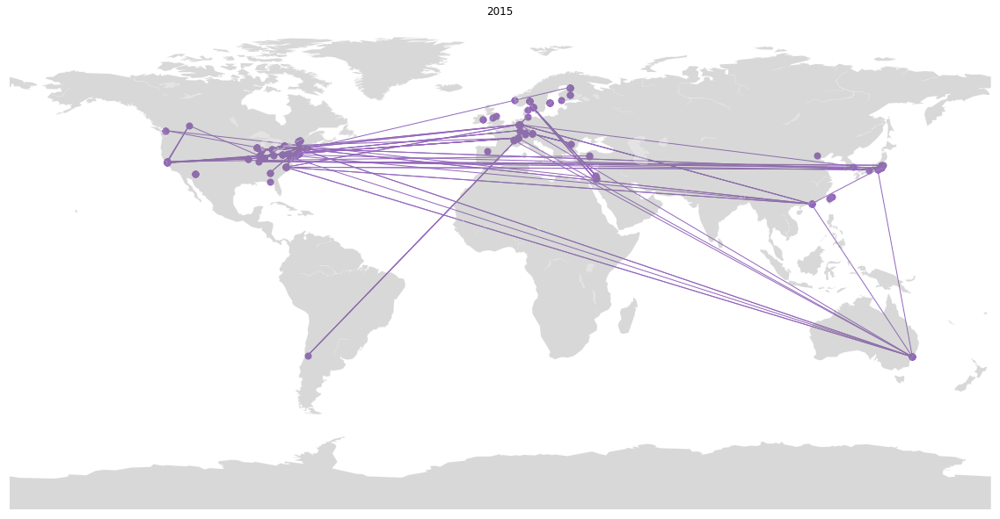

Density of the graph :  0.01575911073589419
The largest component has  63 nodes accounting for 30.43 % of the nodes
The diameter of the largest component is 10
Attribute Assortativity coef: Country:  0.5702618260218159
Attribute Assortativity coef: Uni:  0.44938431626701236


/anaconda3/envs/Biblio/lib/python3.7/site-packages/networkx/drawing/nx_pylab.py:611: MatplotlibDeprecationWarning: isinstance(..., numbers.Number)
  if cb.is_numlike(alpha):


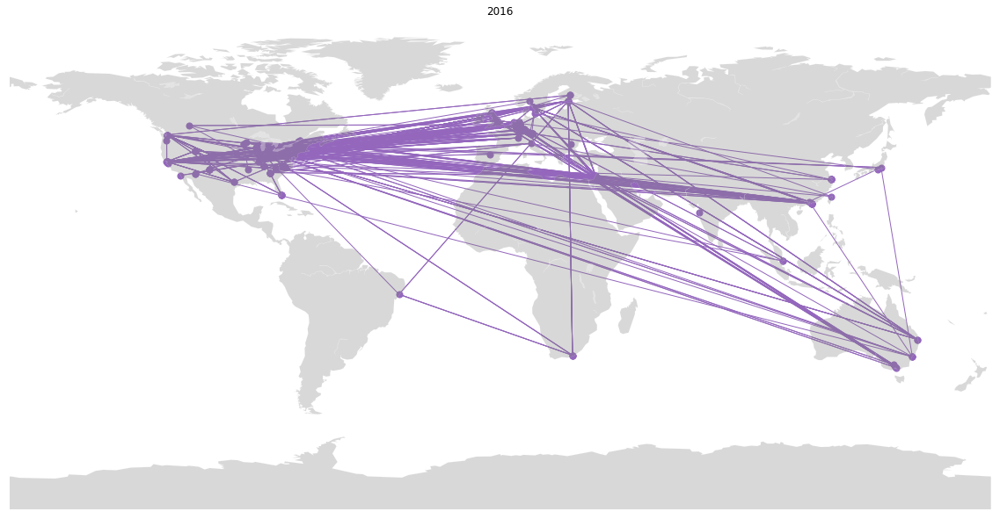

Density of the graph :  0.012544620091789903
The largest component has  177 nodes accounting for 47.71 % of the nodes
The diameter of the largest component is 11
Attribute Assortativity coef: Country:  0.3681508805795039
Attribute Assortativity coef: Uni:  0.29146449720454776


/anaconda3/envs/Biblio/lib/python3.7/site-packages/networkx/drawing/nx_pylab.py:611: MatplotlibDeprecationWarning: isinstance(..., numbers.Number)
  if cb.is_numlike(alpha):


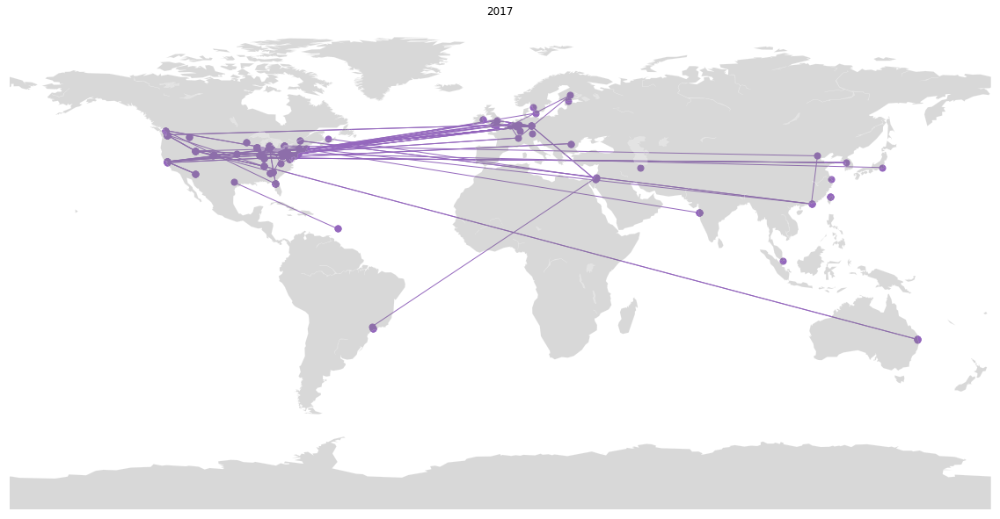

Density of the graph :  0.009948737421682173
The largest component has  16 nodes accounting for 6.96 % of the nodes
The diameter of the largest component is 3
Attribute Assortativity coef: Country:  0.48508608512293483
Attribute Assortativity coef: Uni:  0.4556979300932596


/anaconda3/envs/Biblio/lib/python3.7/site-packages/networkx/drawing/nx_pylab.py:611: MatplotlibDeprecationWarning: isinstance(..., numbers.Number)
  if cb.is_numlike(alpha):


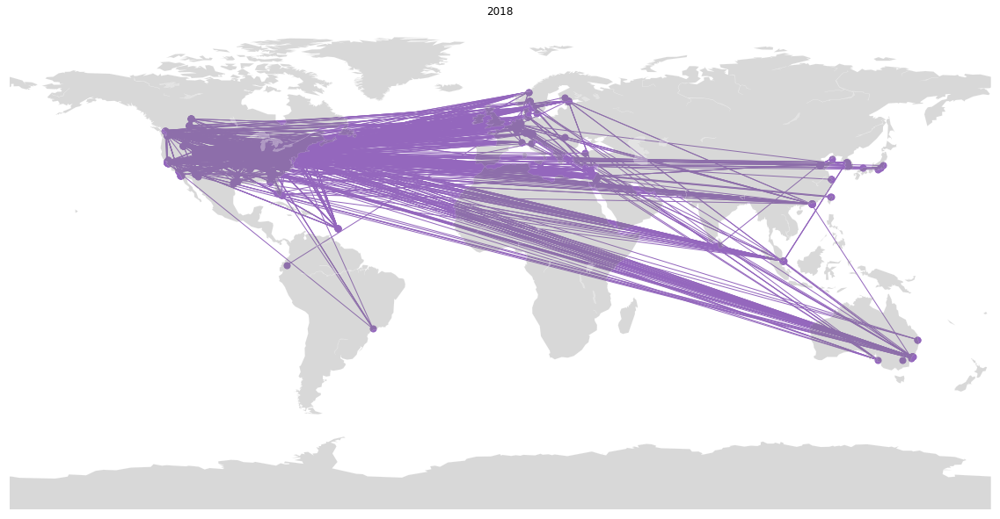

Density of the graph :  0.00503633386047538
The largest component has  343 nodes accounting for 35.65 % of the nodes
The diameter of the largest component is 15
Attribute Assortativity coef: Country:  0.4426874250003271
Attribute Assortativity coef: Uni:  0.33297267842151657


In [134]:
for year in sorted(nodes.issued.unique()):

    plt.figure(figsize=(20, 20))
    plt.title(year)
    m=Basemap()
    m.drawmapboundary(linewidth=0)
    m.fillcontinents(color='grey', alpha=0.3)
    m.drawcoastlines(linewidth=0.1, color="white")
    data = nodes[nodes.issued == year].copy()
    cluster = nodes[nodes.issued == year].index.tolist()
    m.scatter(data['Lon'], data['Lat'], s= 50, c= palette.as_hex()[i], alpha=1)

    sub_network = graph.subgraph(cluster)
    embedding = nodes.iloc[cluster].apply(lambda x: [x.Lon, x.Lat], axis=1)
    nx.draw_networkx_edges(sub_network,  pos = embedding, 
                           edge_color=palette.as_hex()[i], width = 1)
    plt.show()
    print('Density of the graph : ' , nx.density(sub_network))
    comp = list(nx.connected_components(sub_network))
    largest_comp = max(comp, key=len)
    percentage_lcc = len(largest_comp)/ sub_network.number_of_nodes() * 100
    print('The largest component has ',
          len(largest_comp), 'nodes',
          'accounting for %.2f'% percentage_lcc, 
          '% of the nodes')
    lcc_quak = sub_network.subgraph(largest_comp)
    diameter = nx.diameter(lcc_quak)
    print("The diameter of the largest component is", diameter)
    print('Attribute Assortativity coef: Country: ', nx.attribute_assortativity_coefficient(sub_network, 'country'))
    print('Attribute Assortativity coef: Uni: ', nx.attribute_assortativity_coefficient(sub_network, 'uni'))
    
    

From the above we can deduce that:
1. the community is becomming less tight knit by the year (Density of graph, Diameter, Largest component)
2. something weird is going on in 2017, why is largest commponent so smal
3. CLCS seems to be stronger on geographicaly linked (country/uni) collaboration (Attribute Assorativity Coefficient), which gives us how likely two nodes are linked given that they have the same attribute (country/uni)

## ICLS vs CSCL:

/anaconda3/envs/Biblio/lib/python3.7/site-packages/networkx/drawing/nx_pylab.py:611: MatplotlibDeprecationWarning: isinstance(..., numbers.Number)
  if cb.is_numlike(alpha):


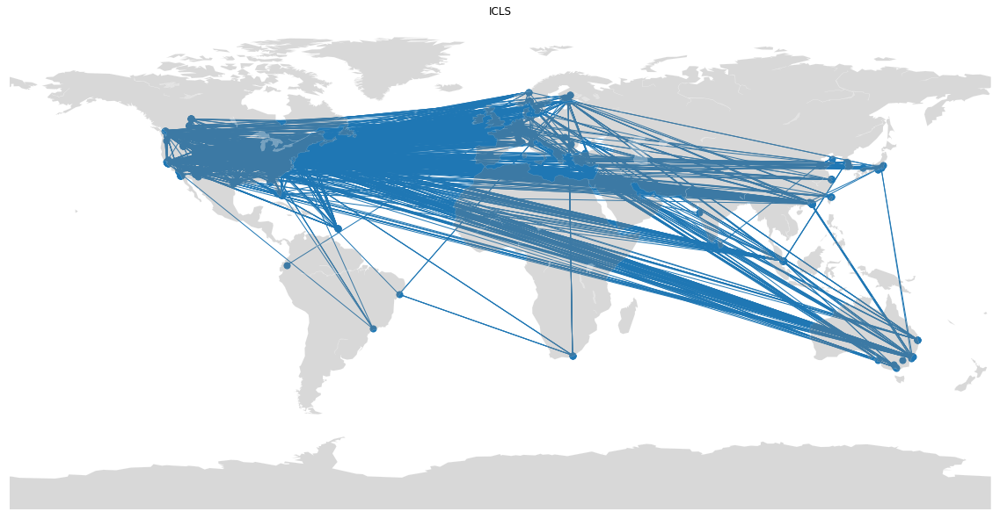

Attribute Assortativity coef: Country:  0.42463419214198556
Attribute Assortativity coef: Uni:  0.32072568597631373


/anaconda3/envs/Biblio/lib/python3.7/site-packages/networkx/drawing/nx_pylab.py:611: MatplotlibDeprecationWarning: isinstance(..., numbers.Number)
  if cb.is_numlike(alpha):


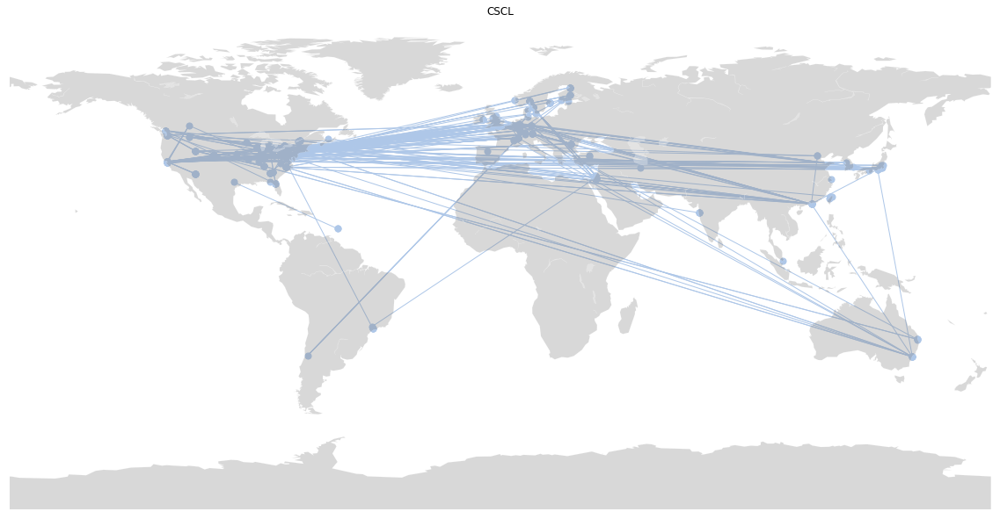

Attribute Assortativity coef: Country:  0.48437970205342873
Attribute Assortativity coef: Uni:  0.41198511091601775


In [135]:
for i, title in enumerate(['ICLS', 'CSCL']):
    plt.figure(figsize=(20, 20))
    plt.title(title)
    m=Basemap()
    m.drawmapboundary(linewidth=0)
    m.fillcontinents(color='grey', alpha=0.3)
    m.drawcoastlines(linewidth=0.1, color="white")
    data = nodes[nodes.issued % 2 == i].copy()
    cluster = nodes[nodes.issued % 2 == i].index.tolist()
    m.scatter(data['Lon'], data['Lat'], s= 50, c= palette.as_hex()[i], alpha=1)

    sub_network = graph.subgraph(cluster)
    embedding = nodes.iloc[cluster].apply(lambda x: [x.Lon, x.Lat], axis=1)
    nx.draw_networkx_edges(sub_network,  pos = embedding, 
                           edge_color=palette.as_hex()[i], width = 1)
    plt.show()
    print('Attribute Assortativity coef: Country: ', nx.attribute_assortativity_coefficient(sub_network, 'country'))
    print('Attribute Assortativity coef: Uni: ', nx.attribute_assortativity_coefficient(sub_network, 'uni'))


Again, combining the years we see that CSCL collaboration is more likely to be within a country/university than in ICLS.